# PSF

In [1]:
target_pixel = 455
psf_range = 36.0

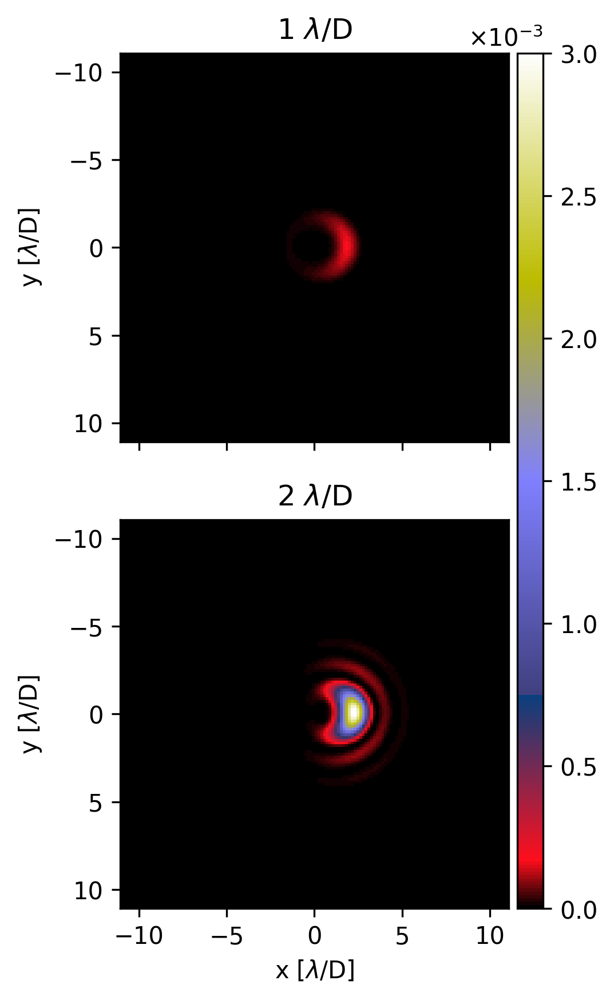

In [2]:
from hcipy import *
import matplotlib.pyplot as plt
import numpy as np

# Create grids and propagator
pupil_grid = make_pupil_grid(target_pixel*2, 1.5)
focal_grid_resolution = target_pixel/2/psf_range
focal_grid = make_focal_grid(focal_grid_resolution, psf_range)
prop = FraunhoferPropagator(pupil_grid, focal_grid)
normal_factor = np.pi*(focal_grid_resolution/2)**2

# Create a Lyot mask and coronagraph
lyot_mask = evaluate_supersampled(make_circular_aperture(0.95), pupil_grid, 4)
coro = VortexCoronagraph(pupil_grid, charge=6)
lyot_stop = Apodizer(lyot_mask)

# Create an aperture using the hcipy library
aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)

# Define center coordinates and radius (adjust values as needed)
center_x = target_pixel // 2
center_y = target_pixel // 2
radius = min(70, target_pixel // 2)  # Adjust radius based on desired area

# List of x values to iterate over
x_values = range(1,3)

# Create a list to store all sub-images
sub_images = []

# Loop through each x value and create separate plots
for x in x_values:
    # Calculate Wavefront for current x
    Wavefront_pos = aperture * np.exp(2j * np.pi * (pupil_grid.x * x + pupil_grid.y * 0))
    wf = Wavefront(Wavefront_pos)
    img = prop(lyot_stop(coro(wf))).intensity
    lambdaD_img = img.to_dict()["values"].reshape(target_pixel, target_pixel)

    # Extract desired sub-region of the image
    lambdaD_part = lambdaD_img[center_y - radius:center_y + radius, center_x - radius:center_x + radius]

    # Append the sub-image to the list
    sub_images.append(lambdaD_part)

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(len(x_values), 1, figsize=(5, 6.47), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in enumerate(axs):
    img = ax.imshow(sub_images[i]/normal_factor, cmap='gist_stern', vmin = 0, vmax = 0.003, extent=psf_range*2*radius/target_pixel*np.array([-1,1,-1,1]))
    ax.set_title(f"{x_values[i]}"+r' $\lambda$/D')  # Add title for each plot
    ax.set_ylabel(r'y [$\lambda$/D]')
    if i == len(x_values)-1:
        ax.set_xlabel(r'x [$\lambda$/D]')
    ax.invert_yaxis()

# Add colorbar in scientific notation
#cbar = fig.colorbar(img, ax=axs.ravel().tolist(), orientation='vertical')
cax = fig.add_axes([axs[-1].get_position().x1+0.01,axs[-1].get_position().y0,0.03,axs[0].get_position().y1-axs[-1].get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)
# cbar.set_label('Intensity')

plt.show()
fig.savefig("figures/lambdaD12.png", format='png', bbox_inches='tight')

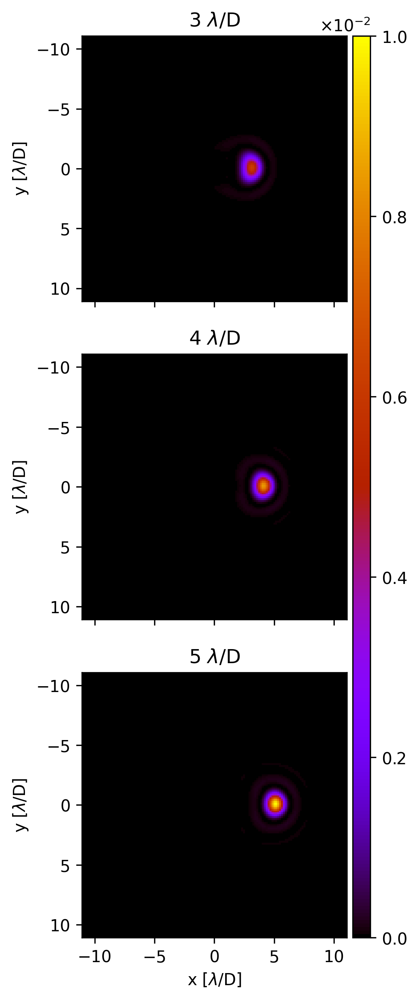

In [3]:
from hcipy import *
import matplotlib.pyplot as plt
import numpy as np

# Create grids and propagator
pupil_grid = make_pupil_grid(target_pixel*2, 1.5)
focal_grid_resolution = target_pixel/2/psf_range
focal_grid = make_focal_grid(focal_grid_resolution, psf_range)
prop = FraunhoferPropagator(pupil_grid, focal_grid)
normal_factor = np.pi*(focal_grid_resolution/2)**2

# Create a Lyot mask and coronagraph
lyot_mask = evaluate_supersampled(make_circular_aperture(0.95), pupil_grid, 4)
coro = VortexCoronagraph(pupil_grid, charge=6)
lyot_stop = Apodizer(lyot_mask)

# Create an aperture using the hcipy library
aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)

# Define center coordinates and radius (adjust values as needed)
center_x = target_pixel // 2
center_y = target_pixel // 2
radius = min(70, target_pixel // 2)  # Adjust radius based on desired area

# List of x values to iterate over
x_values = range(3,6)

# Create a list to store all sub-images
sub_images = []

# Loop through each x value and create separate plots
for x in x_values:
    # Calculate Wavefront for current x
    Wavefront_pos = aperture * np.exp(2j * np.pi * (pupil_grid.x * x + pupil_grid.y * 0))
    wf = Wavefront(Wavefront_pos)
    img = prop(lyot_stop(coro(wf))).intensity
    lambdaD_img = img.to_dict()["values"].reshape(target_pixel, target_pixel)

    # Extract desired sub-region of the image
    lambdaD_part = lambdaD_img[center_y - radius:center_y + radius, center_x - radius:center_x + radius]

    # Append the sub-image to the list
    sub_images.append(lambdaD_part)

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(len(x_values), 1, figsize=(5, 10), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in enumerate(axs):
    img = ax.imshow(sub_images[i]/normal_factor, cmap='gnuplot', vmin = 0, vmax = 0.01, extent=psf_range*2*radius/target_pixel*np.array([-1,1,-1,1]))
    ax.set_title(f"{x_values[i]}"+r' $\lambda$/D')  # Add title for each plot
    ax.set_ylabel(r'y [$\lambda$/D]')
    if i == len(x_values)-1:
        ax.set_xlabel(r'x [$\lambda$/D]')
    ax.invert_yaxis()

# Add colorbar
#cbar = fig.colorbar(img, ax=axs.ravel().tolist(), orientation='vertical')
cax = fig.add_axes([axs[-1].get_position().x1+0.01,axs[-1].get_position().y0,0.03,axs[0].get_position().y1-axs[-1].get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
# cbar.set_label('Intensity')

plt.show()
fig.savefig("figures/lambdaD345.png", format='png', bbox_inches='tight')

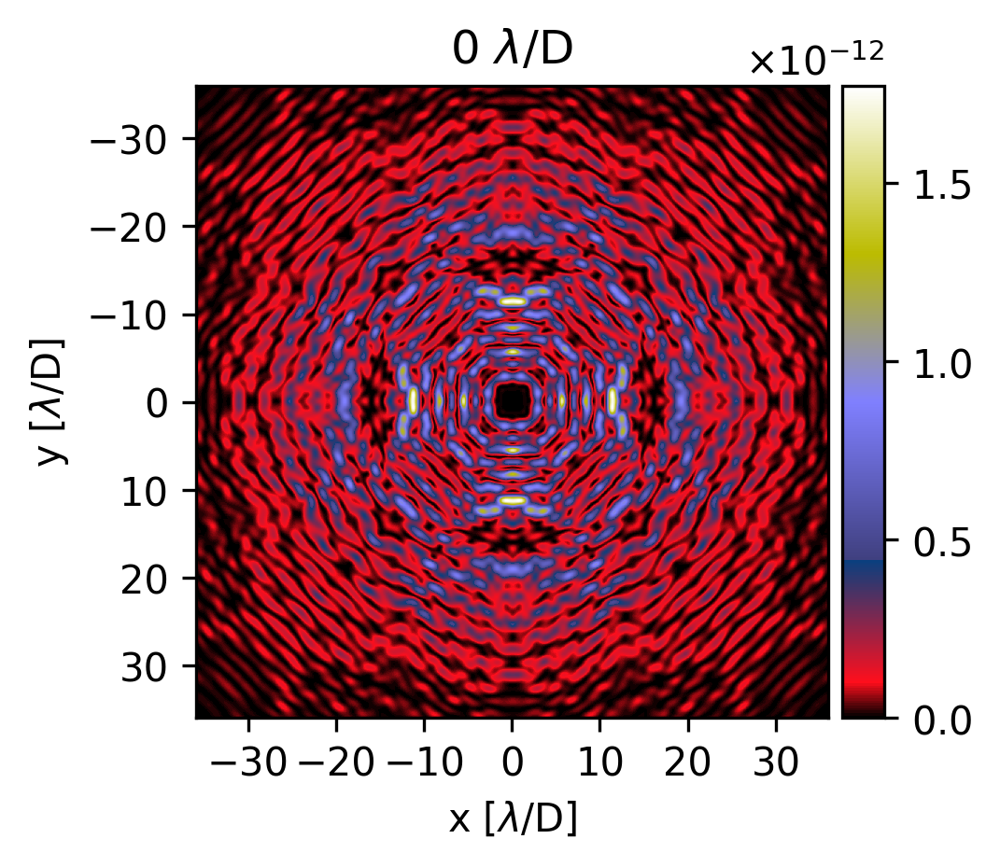

In [4]:
from hcipy import *
import matplotlib.pyplot as plt
import numpy as np

# Create grids and propagator
pupil_grid = make_pupil_grid(target_pixel*2, 1.5)
focal_grid_resolution = target_pixel/2/psf_range
focal_grid = make_focal_grid(focal_grid_resolution, psf_range)
prop = FraunhoferPropagator(pupil_grid, focal_grid)
normal_factor = np.pi*(focal_grid_resolution/2)**2

# Create a Lyot mask and coronagraph
lyot_mask = evaluate_supersampled(make_circular_aperture(0.95), pupil_grid, 4)
coro = VortexCoronagraph(pupil_grid, charge=6)
lyot_stop = Apodizer(lyot_mask)

# Create an aperture using the hcipy library
aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)

# Define center coordinates and radius (adjust values as needed)
center_x = target_pixel // 2
center_y = target_pixel // 2
radius = min(target_pixel // 2, target_pixel // 2)  # Adjust radius based on desired area

# List of x values to iterate over
x_values = range(0,1)

# Create a list to store all sub-images
sub_images = []

# Loop through each x value and create separate plots
for x in x_values:
    # Calculate Wavefront for current x
    Wavefront_pos = aperture * np.exp(2j * np.pi * (pupil_grid.x * x + pupil_grid.y * 0))
    wf = Wavefront(Wavefront_pos)
    img = prop(lyot_stop(coro(wf))).intensity
    lambdaD_img = img.to_dict()["values"].reshape(target_pixel, target_pixel)

    # Extract desired sub-region of the image
    lambdaD_part = lambdaD_img[center_y - radius:center_y + radius, center_x - radius:center_x + radius]

    # Append the sub-image to the list
    sub_images.append(lambdaD_part)

# Combine all sub-images into a single plot with a shared colorbar
fig, ax = plt.subplots(len(x_values), 1, figsize=(5, 2.93), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[0,ax]]:
    img = ax.imshow(sub_images[i]/normal_factor, cmap='gist_stern', extent=psf_range*2*radius/target_pixel*np.array([-1,1,-1,1]))
    ax.set_title(f"{x_values[i]}"+r' $\lambda$/D')  # Add title for each plot
    ax.set_ylabel(r'y [$\lambda$/D]')
    if i == len(x_values)-1:
        ax.set_xlabel(r'x [$\lambda$/D]')
    ax.invert_yaxis()

# Add colorbar (optional)
# colorbar = plt.colorbar(img, orientation='vertical')
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.03,ax.get_position().y1-ax.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=5)
# cbar.set_label('Intensity')

# set the ticks of the x and y axis
ax.set_yticks(np.arange(-30, 40, 10))
ax.set_xticks(np.arange(-30, 40, 10))

plt.show()
fig.savefig("figures/lambdaD0.png", format='png', bbox_inches='tight')

# Vortex

In [5]:
def downsample_image(image, n, final_size):
    """Downsamples a 1D or 2D NumPy array by combining n^2 pixels into 1 pixel

    Args:
        image: A 1D or 2D NumPy array representing the image.

    Returns:
        A 2D NumPy array representing the downsampled image.
    """
    # Reshape the image into a 3D array
    image = image.reshape(final_size, n, final_size, n)

    # Average the pixels in each block
    return image.sum(axis=(1, 3))

In [6]:
%%time
import multiprocessing as mp
import itertools
import numpy as np
from astropy.io import fits
import h5py
target_pixel = 455 # The pixel number of the target image in the x-direction and y-direction
# Calculate the psf scale in arcsecs per pixel
rad_to_arcsecond = 206264.806247
visual_range = 72 # in lambda/D

# Example .fits file has unit W/m^2/pixel
# vF_v(W/m^2/pixel) to F_v(Jy/arcsec^2)
light_speed = 299792458 # m/s
jy=10**26 # The conversion factor from W / m^2 / sr / Hz to Jy

super_sample = 3
wavelengths_nm = [575,660,730,825] # meter
Ds = {"3m":3,"6m":6,"8m":8} # aperture size in meter
incs = [0, 15, 30, 45, 60, 75, 85, 90]

pre_img_number = len(wavelengths_nm)*len(Ds)*len(incs)
pre_imgs = np.empty([pre_img_number,target_pixel,target_pixel], dtype=np.float64)
psf_scales = np.empty(pre_img_number, dtype=np.float64)
fits_names = np.empty(pre_img_number, dtype=object)
img_wavelengths_nm = np.empty(pre_img_number, dtype=np.uint16)
telescope_sizes = np.empty(pre_img_number, dtype=np.float64)
for i, (wavelength_nm, D_name, inc) in zip(range(pre_img_number), itertools.product(wavelengths_nm, Ds, incs)):
    #print(D, wavelength)
    D = Ds[D_name]
    wavelength = wavelength_nm*1e-9   
    psf_scale = wavelength/D*rad_to_arcsecond*visual_range/target_pixel # arcsec per pixel
    fits_name = str(wavelength_nm)+D_name+str(inc)
    fits_read = fits.open("Toy_Coronagraph/tests/mcfost/"+fits_name+".fits")
    super_origin = fits_read[0].data[5,0] # vF_v(W/m^2/pixel)
    origin = downsample_image(super_origin, super_sample, target_pixel)

    F_transfer = jy*wavelength/light_speed/psf_scale**2
    F_v = origin*F_transfer # F_v(Jy/arcsec^2)
    pre_imgs[i] = F_v.astype(np.float64)
    psf_scales[i] = psf_scale
    fits_names[i] = fits_name
    img_wavelengths_nm[i] = wavelength_nm
    telescope_sizes[i] = D

CPU times: user 1.74 s, sys: 329 ms, total: 2.07 s
Wall time: 2.09 s


In [7]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables
from toycoronagraph.psf import cir_iwa

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.open_file('/mnt/chia/vortex_36_455.h5', 'r') as psfh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        sub_images.append(pre_imgs[img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Disk Model")
        # Remove the dust inside IWA
        pre_imgs_iwa = pre_imgs[img_number].copy()
        points = np.array(np.meshgrid(np.arange(-227,228), np.arange(-227,228))).reshape(2,455,455)
        distances = np.linalg.norm(points, axis=0)
        # Import the PSFs
        psfs_all = psfh5.root['c'+str(charge)]
        # Set points closer to the center than the IWA to one, and the rest to zero
        pre_imgs_iwa[distances <= cir_iwa(psfs_all[0])] = 0
        sub_images.append(pre_imgs_iwa)
        img_scales.append(psf_scales[img_number])
        img_titles.append("Disk Model omit the Dust inside IWA")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Define center coordinates and radius (adjust values as needed)
center_x = target_pixel // 2
center_y = target_pixel // 2
radius = min(70, target_pixel // 2)  # Adjust radius based on desired area

# Plot the final image
for i, ax in [[0,axs]]:
    # Create a new figure and axes for plotting
    sub_images_part = sub_images[i][center_y - radius:center_y + radius, center_x - radius:center_x + radius]
    img = ax.imshow(sub_images_part, cmap='gnuplot', vmin = 0, vmax = np.max(sub_images[-1:]), extent=img_scales[i]*radius*2*np.array([-0.5,0.5,-0.5,0.5]))
    #ax.set_title(img_titles[i])  # Add title for each plot
    #ax.set_xlabel('x [arcsec]')
    #ax.set_ylabel('y [arcsec]')
    ax.set_axis_off()
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=5)
cbar.set_label(r"Jy/arcsec^2")

plt.show()

FileNotFoundError: ``/mnt/chia/vortex_36_455.h5`` does not exist

  0%|          | 0/1 [00:00<?, ?it/s]

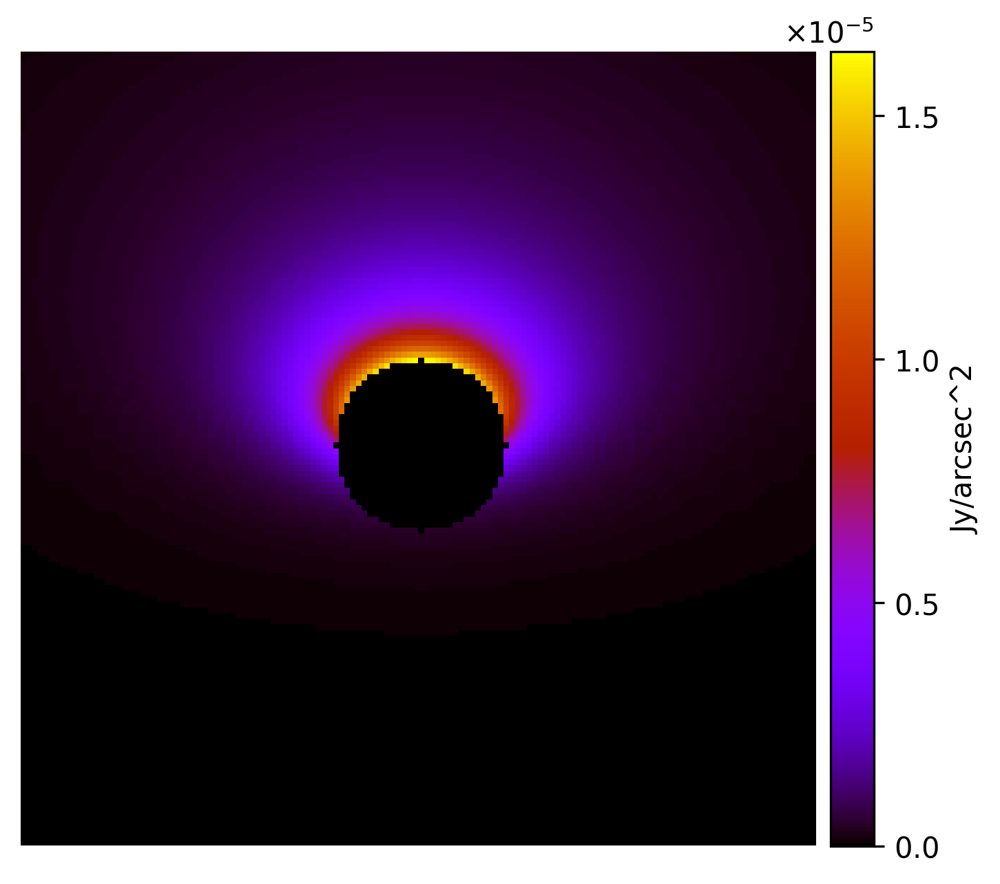

In [8]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables
from toycoronagraph.psf import cir_iwa

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.open_file('/mnt/chia/vortex_36_455.h5', 'r') as psfh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        # Remove the dust inside IWA
        pre_imgs_iwa = pre_imgs[img_number].copy()
        points = np.array(np.meshgrid(np.arange(-227,228), np.arange(-227,228))).reshape(2,455,455)
        distances = np.linalg.norm(points, axis=0)
        # Import the PSFs
        psfs_all = psfh5.root['c'+str(charge)]
        # Set points closer to the center than the IWA to one, and the rest to zero
        pre_imgs_iwa[distances <= cir_iwa(psfs_all[0])] = 0
        sub_images.append(pre_imgs_iwa)
        img_scales.append(psf_scales[img_number])
        img_titles.append("Disk Model omit the Dust inside IWA")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Define center coordinates and radius (adjust values as needed)
center_x = target_pixel // 2
center_y = target_pixel // 2
radius = min(70, target_pixel // 2)  # Adjust radius based on desired area

# Plot the final image
for i, ax in [[0,axs]]:
    # Create a new figure and axes for plotting
    sub_images_part = sub_images[i][center_y - radius:center_y + radius, center_x - radius:center_x + radius]
    img = ax.imshow(sub_images_part, cmap='gnuplot', vmin = 0, vmax = np.max(sub_images[-1:]), extent=img_scales[i]*radius*2*np.array([-0.5,0.5,-0.5,0.5]))
    #ax.set_title(img_titles[i])  # Add title for each plot
    #ax.set_xlabel('x [arcsec]')
    #ax.set_ylabel('y [arcsec]')
    ax.set_axis_off()
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=5)
cbar.set_label(r"Jy/arcsec^2")

plt.show()
#fig.savefig("figures/VC6iwa.png", format='png', bbox_inches='tight')

# Compare Pairs
### UniformDust+FullConvo vs MCFOST+FullConvo
### ExoVista+FullConvo vs MCFOST+FullConvo
### MCFOST+FullConvo vs MCFOST+T_Sky Methods

  0%|          | 0/1 [00:00<?, ?it/s]

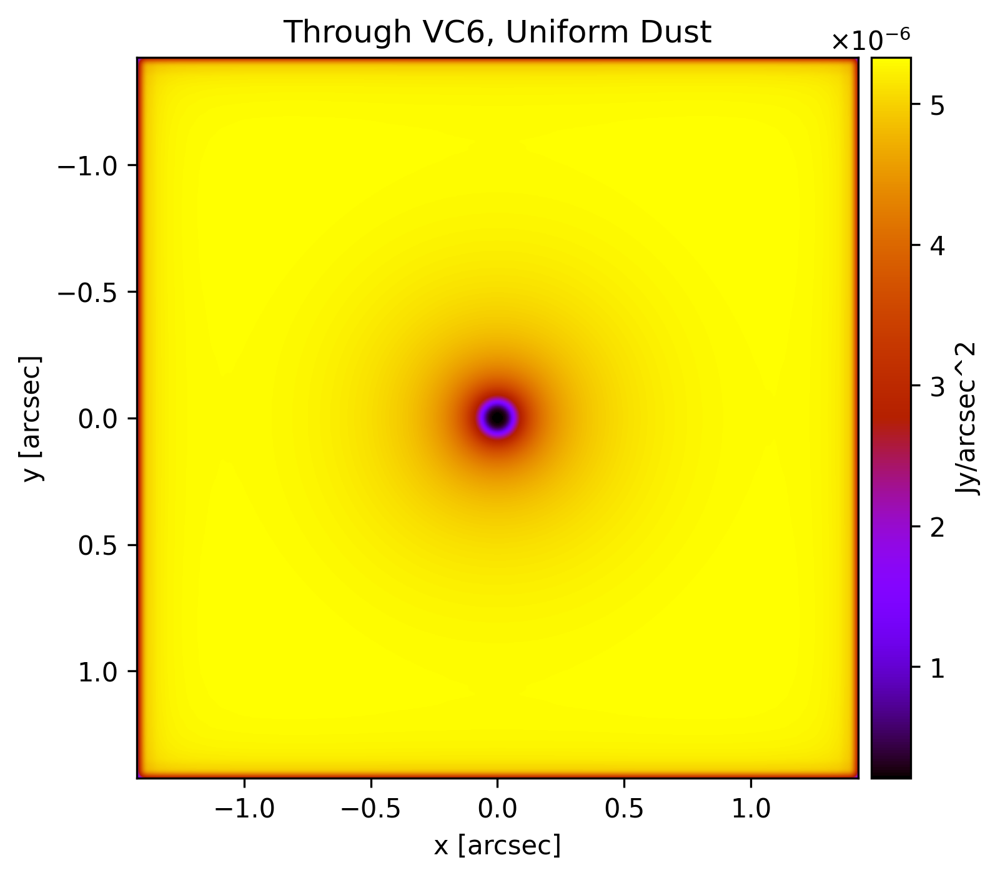

In [ ]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables
# 1 zodi = 22 mag/as^2 in V band
# 22 mag/as^2 in V band is 5.99e-6 Jy/as^2 (Johnson UBVRI+)

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([0],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(fitsh5.root["c"+str(charge)+"sum"][:]*5.99e-6)
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6, Uniform Dust")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[1,axs]]:
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)
cbar.set_label(r"Jy/arcsec^2")

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

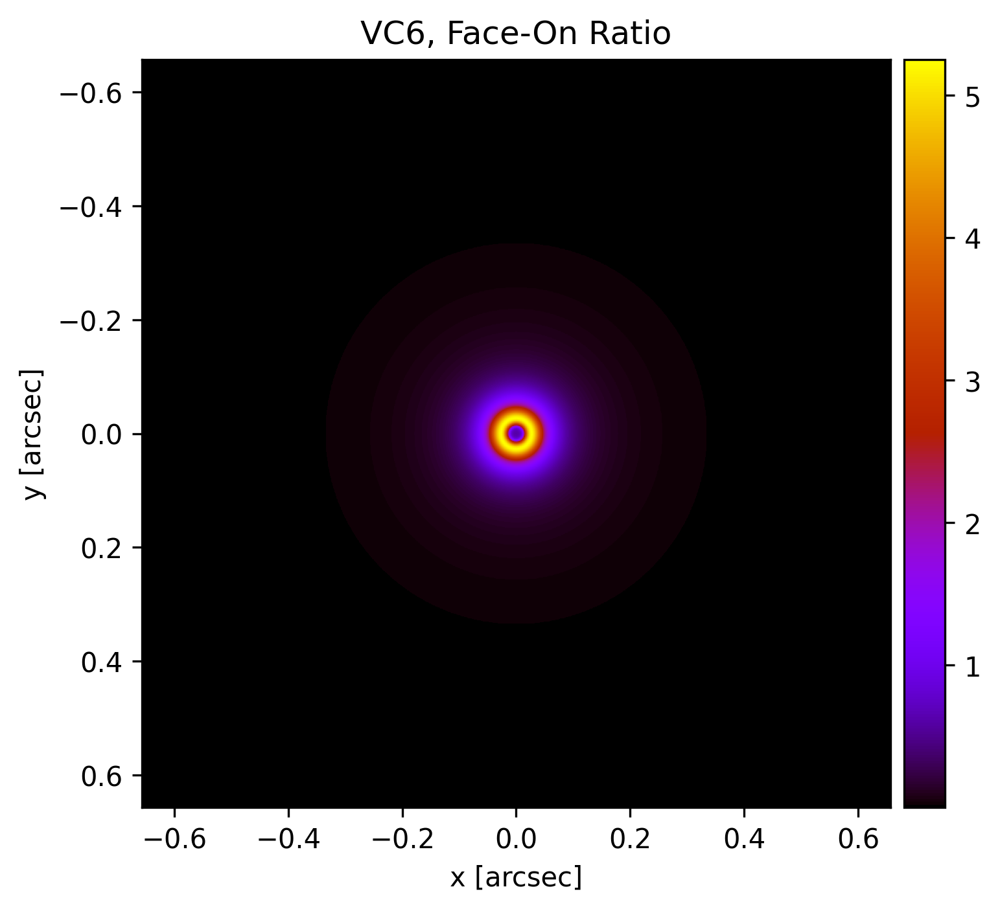

In [ ]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/455_aftvortex.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([0],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(fitsh5.root["c"+str(charge)+"sum"][:]*5.99e-6)
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6, Uniform Dust")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[0,axs]]:
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i]/sub_images[i+1], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title("VC6, Face-On Ratio")  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

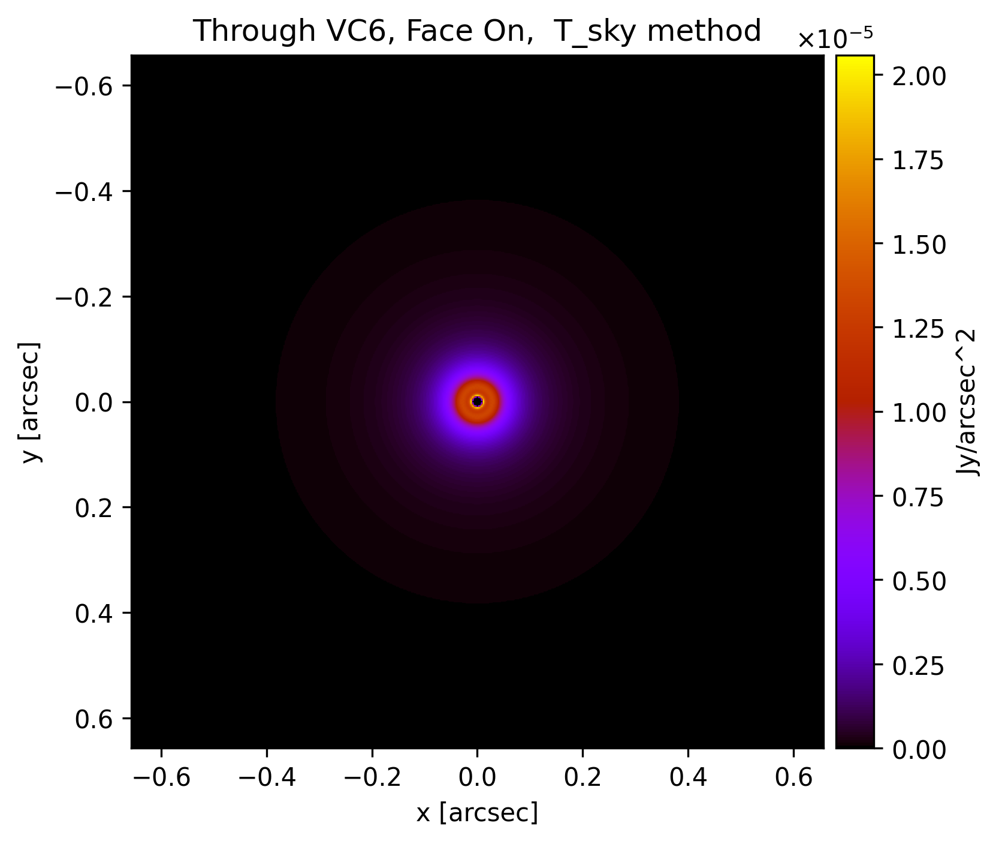

In [46]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([0],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(np.einsum('ij,ij->ij', fitsh5.root["c"+str(charge)+"sum"][:], pre_imgs[img_number]))
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6, Face On,  T_sky method")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[1,axs]]:
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)
cbar.set_label(r"Jy/arcsec^2")

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

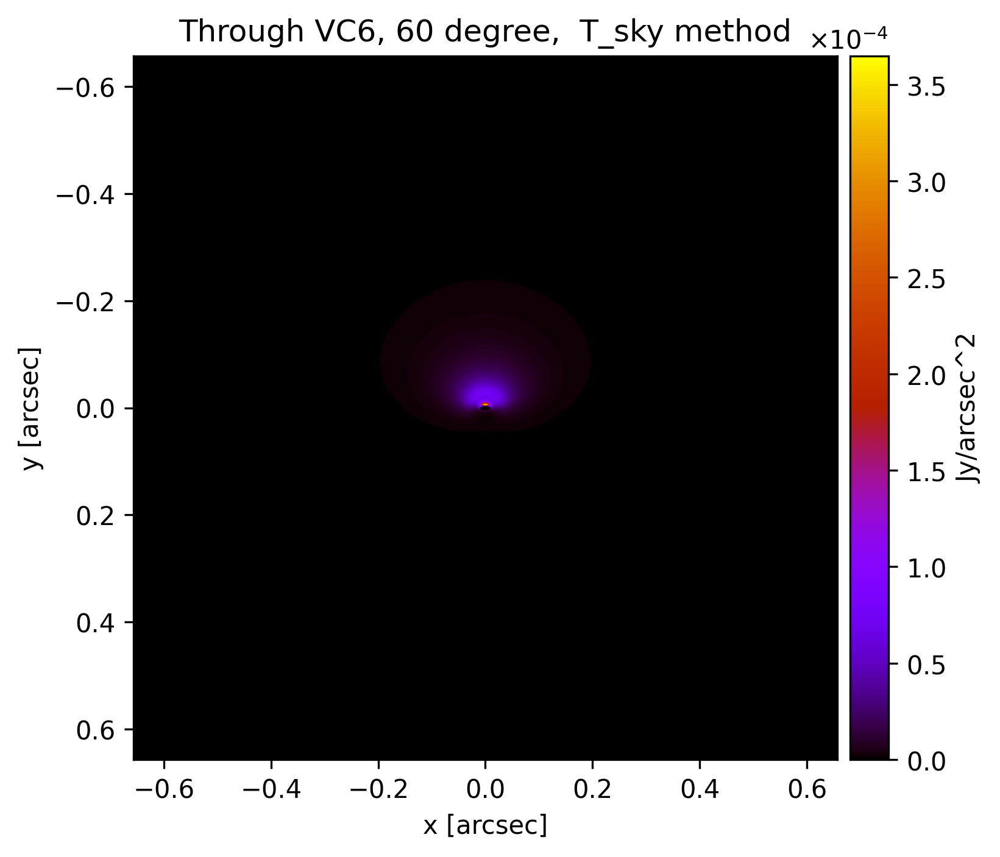

In [27]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(np.einsum('ij,ij->ij', fitsh5.root["c"+str(charge)+"sum"][:], pre_imgs[img_number]))
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6, 60 degree,  T_sky method")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[1,axs]]:
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)
cbar.set_label(r"Jy/arcsec^2")

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipykernel_672193/873150294.py:24: RuntimeWarning: divide by zero encountered in divide
  img = ax.imshow(sub_images[i]/sub_images[i+1], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]), vmax=3)


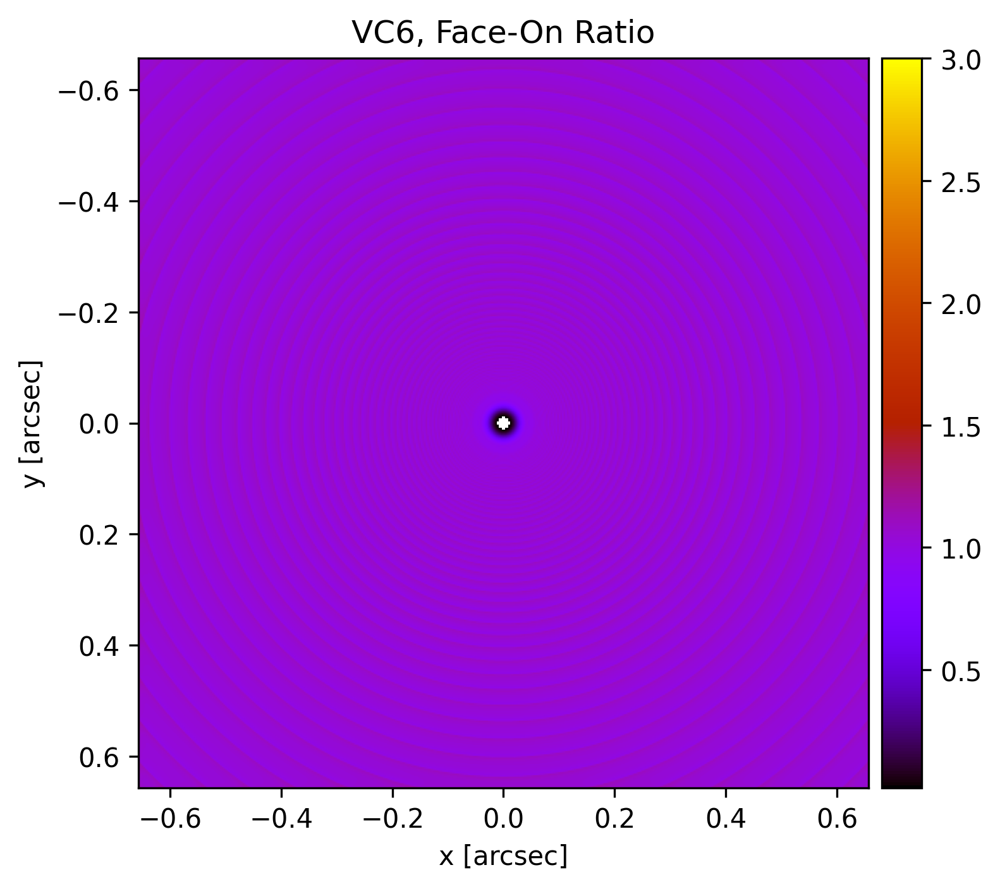

In [44]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([0],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(np.einsum('ij,ij->ij', fitsh5.root["c"+str(charge)+"sum"][:], pre_imgs[img_number]))
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6, 60 degree,  T_sky method")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[0,axs]]:
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i]/sub_images[i+1], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]), vmax=3)
    ax.set_title("VC6, Face-On Ratio")  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipykernel_672193/4156693223.py:24: RuntimeWarning: divide by zero encountered in divide
  img = ax.imshow(sub_images[i]/sub_images[i+1], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]), vmax=3)


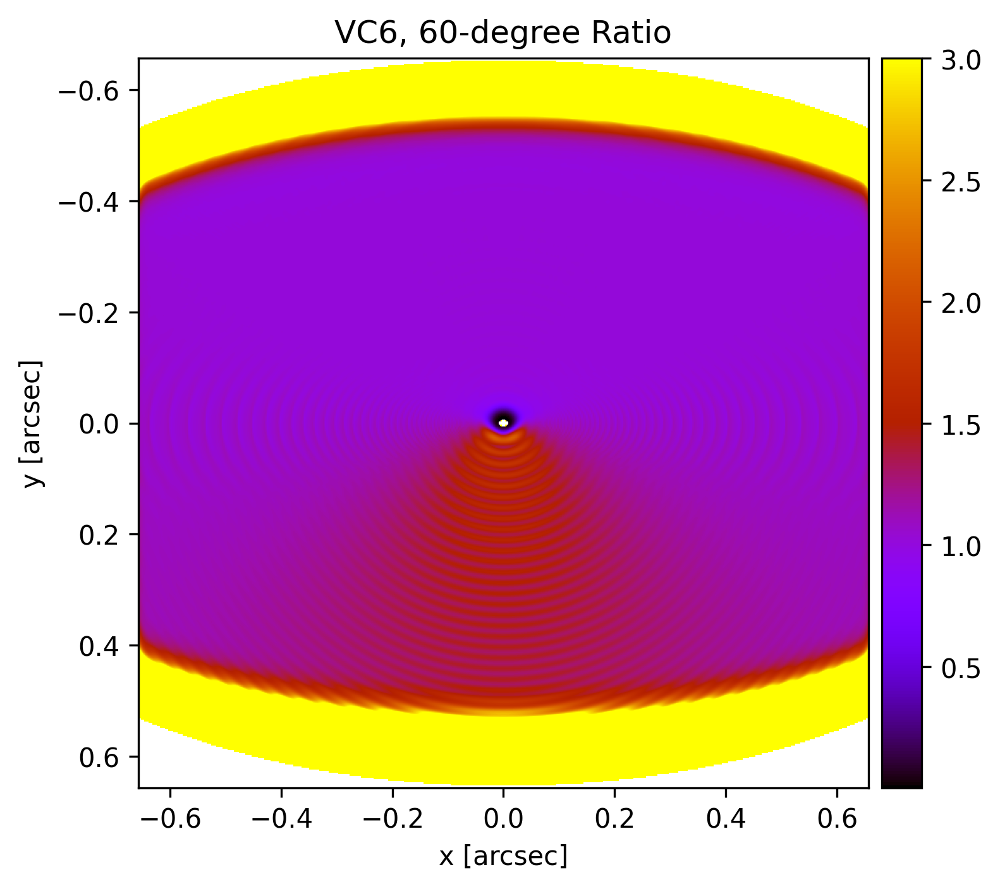

In [52]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(np.einsum('ij,ij->ij', fitsh5.root["c"+str(charge)+"sum"][:], pre_imgs[img_number]))
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6, 60 degree,  T_sky method")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[0,axs]]:
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i]/sub_images[i+1], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]), vmax=3)
    ax.set_title("VC6, 60-degree Ratio")  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

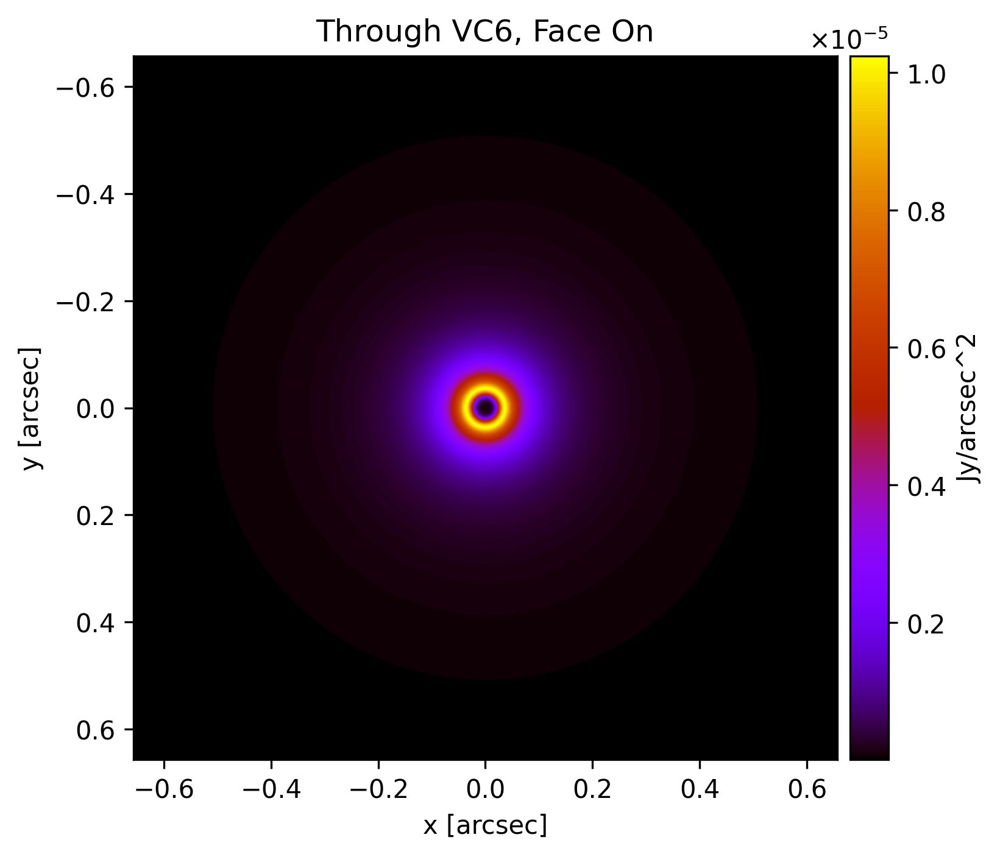

In [47]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([0],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6, Face On")
        sub_images.append(fitsh5.root["c"+str(charge)+"iwa"][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6 but Ignoring the Dust inside IWA")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in [[0,axs]]:
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=10)
cbar.set_label(r"Jy/arcsec^2")

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

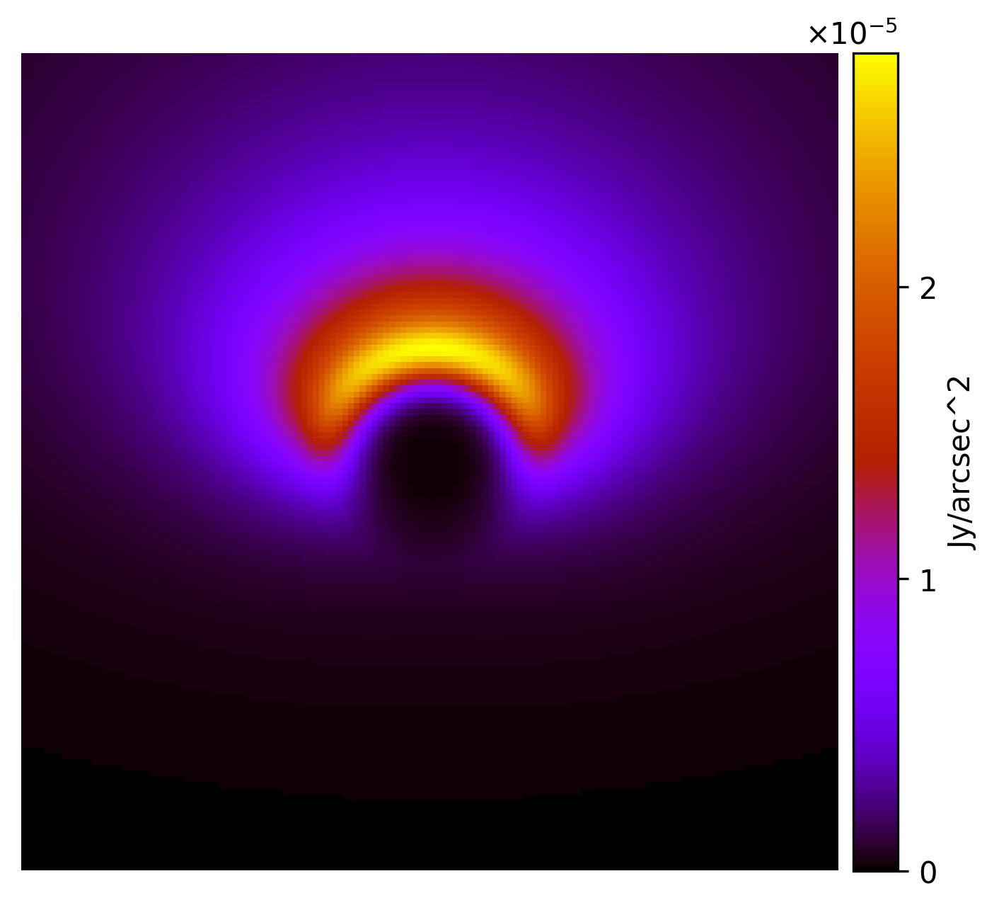

In [11]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(fitsh5.root["c"+str(charge)+"iwa"][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6 but omit the Dust inside IWA")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 1, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# Define center coordinates and radius (adjust values as needed)
center_x = target_pixel // 2
center_y = target_pixel // 2
radius = min(70, target_pixel // 2)  # Adjust radius based on desired area

# Plot the final image
for i, ax in [[1,axs]]:
    # Create a new figure and axes for plotting
    sub_images_part = sub_images[i][center_y - radius:center_y + radius, center_x - radius:center_x + radius]
    img = ax.imshow(sub_images_part, cmap='gnuplot', vmin = 0, vmax = np.max(sub_images[-1:]), extent=img_scales[i]*radius*2*np.array([-0.5,0.5,-0.5,0.5]))
    #ax.set_title(img_titles[i])  # Add title for each plot
    #ax.set_xlabel('x [arcsec]')
    #ax.set_ylabel('y [arcsec]')
    ax.set_axis_off()
    ax.invert_yaxis()
    
# Add color bar
cax = fig.add_axes([axs.get_position().x1+0.01,axs.get_position().y0,0.03,axs.get_position().y1-axs.get_position().y0])
cbar = fig.colorbar(img, cax=cax)
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.locator_params(nbins=5)
cbar.set_label(r"Jy/arcsec^2")

plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

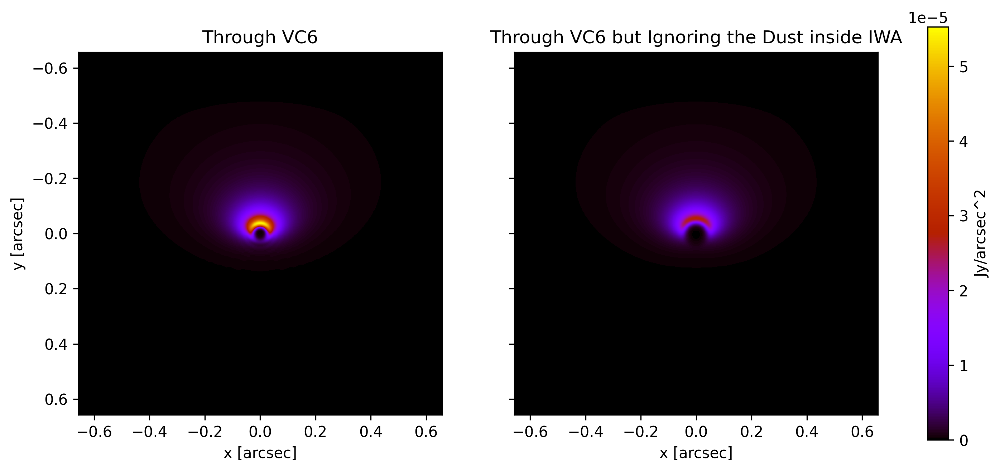

In [12]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(fitsh5.root["c"+str(charge)+"iwa"][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6 but Ignoring the Dust inside IWA")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in enumerate(axs):
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', vmin = 0, vmax = np.max(sub_images[0:]), extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    if i == 0:
        ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
colorbar=plt.colorbar(img, ax=axs.ravel().tolist(), orientation='vertical')
colorbar.set_label(r"Jy/arcsec^2")

plt.show()
fig.savefig("figures/VC6iwa.png", format='png', bbox_inches='tight')

  0%|          | 0/1 [00:00<?, ?it/s]

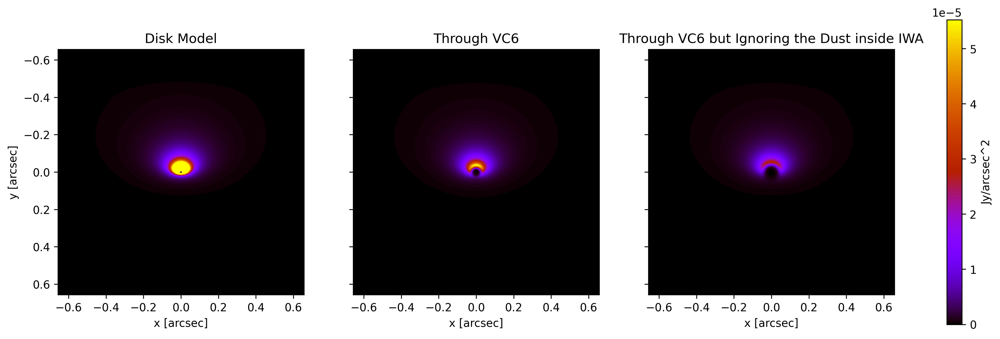

In [49]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        sub_images.append(pre_imgs[img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Disk Model")
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(fitsh5.root["c"+str(charge)+"iwa"][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6 but Ignoring the Dust inside IWA")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 3, figsize=(17, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in enumerate(axs):
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', vmin = 0, vmax = np.max(sub_images[1:]), extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    if i == 0:
        ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
colorbar=plt.colorbar(img, ax=axs.ravel().tolist(), orientation='vertical')
colorbar.set_label(r"Jy/arcsec^2")

plt.show()
fig.savefig("figures/VC6iwa.png", format='png', bbox_inches='tight')

In [50]:
def core_throughput_fun(psfs):
    """
    Calculate the core throughput of a series of PSFs.

    Args:
        psfs (numpy.ndarray): The normalized PSFs.

    Returns:
        numpy.ndarray: The core throughput of the psfs
    """
    psf_len = len(psfs)
    core_throughput = np.empty(psf_len)
    for i in range(psf_len):
        psf_i = psfs[i]
        threshold = 0.5*psf_i.max()
        core_flux = np.where(psf_i > threshold , psf_i, 0)
        core_throughput[i] = np.sum(core_flux)
    return core_throughput
def cir_iwa(psfs):
    """
    Calculate the inner working angle (IWA) of a series of circular symmetric PSFs.

    Args:
        psfs (numpy.ndarray): The normalized PSFs.

    Returns:
        int: The IWA of the PSFs, in units of pixel.
    """
    core_throughput = core_throughput_fun(psfs)
    iwa = np.searchsorted(core_throughput, 0.5*core_throughput.max())
    return iwa
def cir_core_throughput_plot(psfs, plot_dpi=300):
    """
    Plot the core throughput of a series of circular symmetric PSFs.

    Args:
        psfs (numpy.ndarray): The normalized PSFs.
        plot_dpi (int): Dots per inch (DPI) for the plot.

    Returns:
        Core_throughput.png
    """
    core_throughput = core_throughput_fun(psfs)
    iwa = np.searchsorted(core_throughput, 0.5*core_throughput.max())*visual_range/target_pixel
    # Create a new figure with a specified DPI
    fig = plt.figure(dpi=plot_dpi)
    axs = plt.gca()

    # Set axis labels
    axs.set_ylabel('Throughput')
    axs.set_xlabel((r'Separation [$\lambda$/D]'))

    # Set title
    axs.set_title("VC6")
    
    # Plot the core throughput
    plt.plot(np.arange(len(core_throughput))*visual_range/target_pixel, core_throughput, color='orange')
    plt.xlim(0, len(core_throughput)*visual_range/target_pixel)
    
    # Print the maximum throughput
    plt.text(0.65, 0.9, f"Max Throughput: {core_throughput.max():.2f}", transform=axs.transAxes)

    # Mark the IWA with a black verticle line
    plt.axvline(iwa, color='black', linestyle='--')
    
    # Save the figure with the specified name
    fig.savefig("figures/VC6_throughput.png", format='png', bbox_inches='tight')

    # Display the plot
    plt.show()

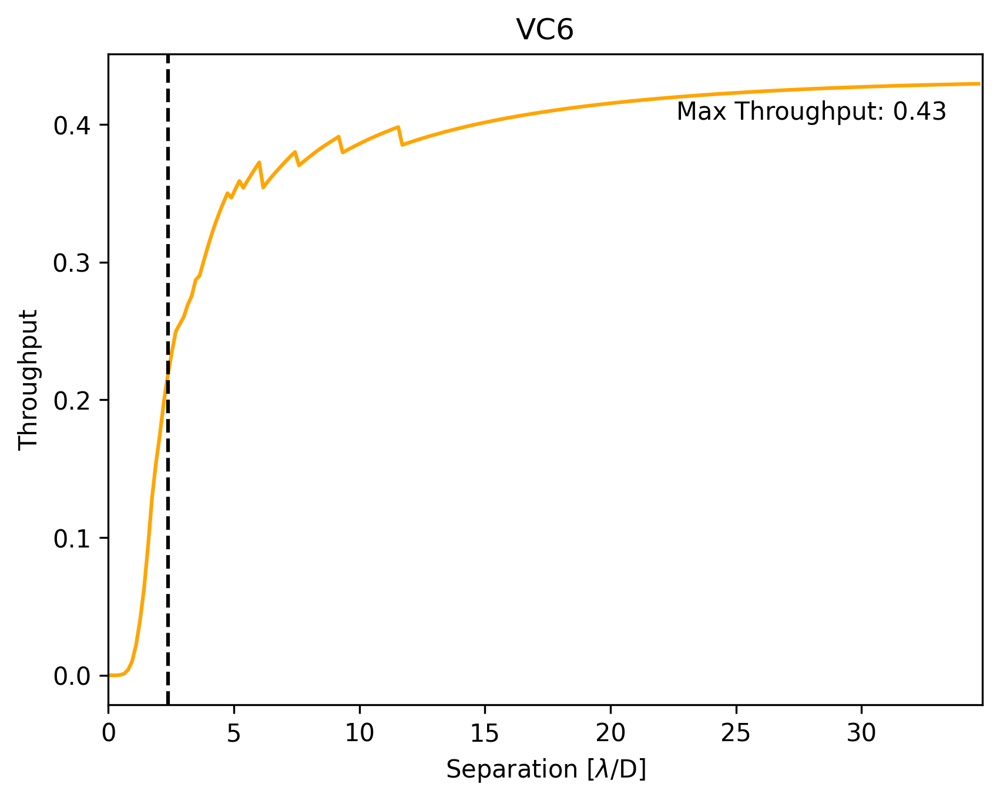

In [51]:

with tables.open_file('/mnt/chia/vortex_36_455.h5', 'r') as psfh5:
    psfs_all = psfh5.root['c6']
    cir_core_throughput_plot(psfs_all[0,:][:-8])

  0%|          | 0/1 [00:00<?, ?it/s]

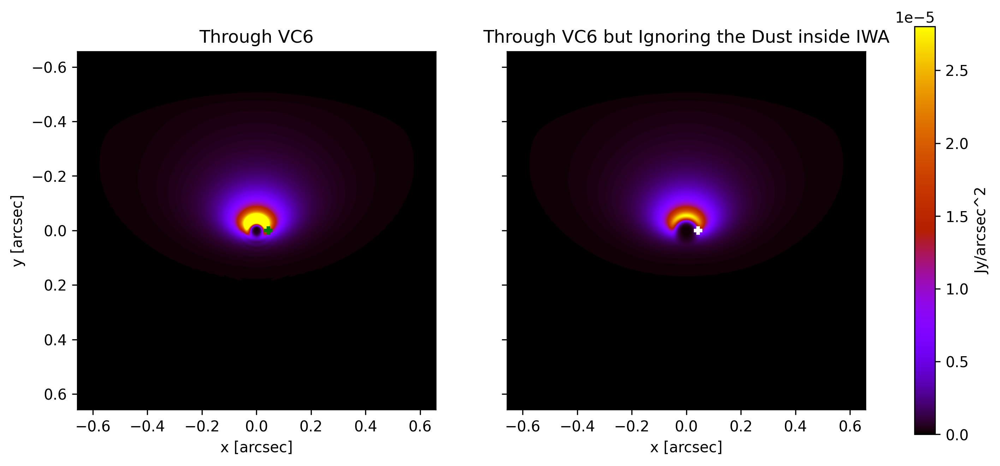

In [52]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.File('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product([4],[6], position=0, leave=True):
        sub_images.append(fitsh5.root["c"+str(charge)][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6")
        sub_images.append(fitsh5.root["c"+str(charge)+"iwa"][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through VC6 but Ignoring the Dust inside IWA")

# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True, dpi=300)
with tables.open_file('/mnt/chia/vortex_36_455.h5', 'r') as psfh5:
    psfs_all = psfh5.root['c6']
    iwa = cir_iwa(psfs_all[0])

# Plot the final image
for i, ax in enumerate(axs):
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', vmin = 0, vmax = np.max(sub_images[1:]), extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    # Add a square symbol at the center
    Star = plt.Line2D([iwa*img_scales[i]], [0], marker='P', color=('green' if i == 0 else 'white'), markersize=5, fillstyle='full')
    ax.add_artist(Star)
    ax.set_xlabel('x [arcsec]')
    if i == 0:
        ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
colorbar=plt.colorbar(img, ax=axs.ravel().tolist(), orientation='vertical')
colorbar.set_label(r"Jy/arcsec^2")

plt.show()
fig.savefig("figures/correction_factors.png", format='png', bbox_inches='tight')

In [53]:
def exoplanet_brightness(star_brightness, albedo, orbit_radius, size):
    '''
    Calculate the planet reflected light brightness.

    Args:
        star_brightness (float): The brightness of the star in Jy.
        albedo (float): The albedo of the planet.
        orbit_radius (float): The radius of the orbit in au.
        size (float): The radius of the planet in km.
    
    Returns:
        float: The brightness of the planet in Jy.
    '''
    # au_to_km 
    orbit_radius = orbit_radius*149597870.7
    return star_brightness*albedo*(size/orbit_radius)**2/8
def blackbody_brightness(lam, T, R, d, A):
    '''
    Calculate the blackbody radiance for a set of wavelengths given a temperature and radiance.

    Parameters
    ---------------
    lam: Reference wavelengths in nm
    T:   Temperature in Kelvin
    R:   Radius in km
    d:   Distance in pc
    A:   Reciever area in m^2

    Output
    ---------------
    Spectral radiance in units of Jy
    '''
    # Convert R in m
    R_m = R * 1e3

    # Convert d in m
    d_m = d * 3.0856775814913673E+16

    # Planck Constant in SI unit
    h = 6.62607015E-34
    
    # Speed of light in m/s
    c = 2.99792458E8

    # Convert wavelength to m
    lam_m = lam * 1E-9

    # Boltzmann Constant in SI unit
    k_B = 1.380649E-23

    # Calculate Radiance B_lam, in units of W/m^2/sr/m
    exponential = (h * c) / (lam_m * k_B * T)
    B = ((2 * h * c) / (lam_m ** 3)) / (np.exp(exponential) - 1)
    # lambda_cutoff=1,alpha=0 to modify in the UV
    # B_lam[x <= lambda_cutoff] *= (x[x <= lambda_cutoff]/lambda_cutoff)**alpha

    # Multiply by the space angle of the star
    omega = np.pi*(R_m/d_m)**2

    # Multiply by the area of the receiver
    return B*omega*A*1e26

In [54]:
# Sun
solar_T = 6000 #Κ
solar_R = 695700 #km
system_d = 10 #pc

# Jupiter
jupiter_size = 69911 #km
jupiter_orbit = 5.20 #au
jupiter_bond_albedo = 0.343	

# Earth
earth_size = 6371 #km
earth_orbit = 1.00 #au
earth_bond_albedo = 0.306

In [59]:
from hcipy import *
import matplotlib.pyplot as plt
import numpy as np
def iwa_plots(charge_number, stop_ratio =0.95, accuracy = 0.00001, target_pixel = 455, psf_range = 36.0):
    # Create grids and propagator
    pupil_grid = make_pupil_grid(target_pixel*2, 1.5)
    focal_grid_resolution = target_pixel/2/psf_range
    focal_grid = make_focal_grid(focal_grid_resolution, psf_range)
    prop = FraunhoferPropagator(pupil_grid, focal_grid)
    normal_factor = np.pi*(focal_grid_resolution/2)**2

    # Create a Lyot mask and coronagraph
    lyot_mask = evaluate_supersampled(make_circular_aperture(stop_ratio), pupil_grid, 4)
    coro = VortexCoronagraph(pupil_grid, charge=charge_number)
    lyot_stop = Apodizer(lyot_mask)

    # Create an aperture using the hcipy library
    aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)

    def vc_psf(pos_x, pos_y):
        # Calculate Wavefront for (pos_x, pos_y)
        Wavefront_pos = aperture * np.exp(2j * np.pi * (pupil_grid.x * pos_x + pupil_grid.y * pos_y))
        #print(pupil_grid.x, pupil_grid.y)
        wf = Wavefront(Wavefront_pos)
        img = prop(lyot_stop(coro(wf))).intensity.to_dict()["values"].reshape(target_pixel, target_pixel)
        return img
    
    def core_throughput(psf):
        """
        Calculate the core throughput of a PSF

        Args:
            psf (numpy.ndarray): The normalized PSF

        Returns:
            np.float64: The core throughput of the psf
        """
        threshold = 0.5*psf.max()
        core_flux = np.where(psf > threshold , psf, 0)
        return np.sum(core_flux)

    # Calculate the maximum core throughput
    core_throughput_max = core_throughput(vc_psf(psf_range//2, 0))
    # use dichotomy to find the IWA, whose core throughput is half of the maximum
    left = 0
    right = psf_range//2
    while right - left > accuracy:
        mid = (left + right) / 2
        if core_throughput(vc_psf(mid, 0)) > 0.5*core_throughput_max:
            right = mid
        else:
            left = mid
    return (left + right) / 2
    
for i in np.linspace(0.1, 0.99, 10):
    print(vc_iwa(6, i))

2.49609375
2.4609375
2.390625
2.390625
2.390625
2.53125
2.53125
2.53125
2.53125
2.53125


In [53]:
from hcipy import *
import matplotlib.pyplot as plt
import numpy as np
def vc_iwa(charge_number, accuracy = 0.00001, target_pixel = 455, psf_range = 36.0):
    # Create grids and propagator
    pupil_grid = make_pupil_grid(target_pixel*2, 1.5)
    focal_grid_resolution = target_pixel/2/psf_range
    focal_grid = make_focal_grid(focal_grid_resolution, psf_range)
    prop = FraunhoferPropagator(pupil_grid, focal_grid)
    normal_factor = np.pi*(focal_grid_resolution/2)**2

    # Create a Lyot mask and coronagraph
    lyot_mask = evaluate_supersampled(make_circular_aperture(0.95), pupil_grid, 4)
    coro = VortexCoronagraph(pupil_grid, charge=charge_number)
    lyot_stop = Apodizer(lyot_mask)

    # Create an aperture using the hcipy library
    aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)

    def vc_psf(pos_x, pos_y):
        # Calculate Wavefront for (pos_x, pos_y)
        Wavefront_pos = aperture * np.exp(2j * np.pi * (pupil_grid.x * pos_x + pupil_grid.y * pos_y))
        #print(pupil_grid.x, pupil_grid.y)
        wf = Wavefront(Wavefront_pos)
        img = prop(lyot_stop(coro(wf))).intensity.to_dict()["values"].reshape(target_pixel, target_pixel)
        return img
    
    def core_throughput(psf):
        """
        Calculate the core throughput of a PSF

        Args:
            psf (numpy.ndarray): The normalized PSF

        Returns:
            np.float64: The core throughput of the psf
        """
        threshold = 0.5*psf.max()
        core_flux = np.where(psf > threshold , psf, 0)
        return np.sum(core_flux)

    # Calculate the maximum core throughput
    core_throughput_max = core_throughput(vc_psf(psf_range//2, 0))
    # use dichotomy to find the IWA, whose core throughput is half of the maximum
    left = 0
    right = psf_range//2
    while right - left > accuracy:
        mid = (left + right) / 2
        if core_throughput(vc_psf(mid, 0)) > 0.5*core_throughput_max:
            right = mid
        else:
            left = mid
    return (left + right) / 2
    

vc_iwa(6)

2.46533203125

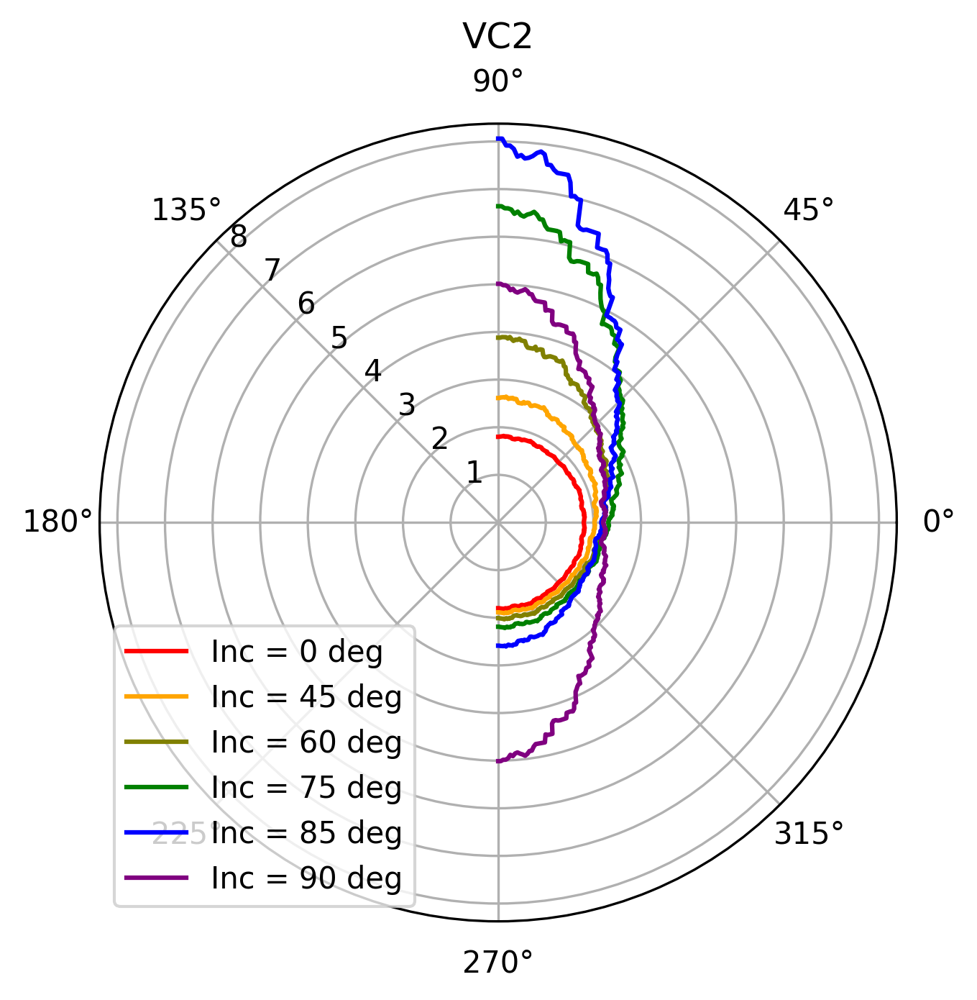

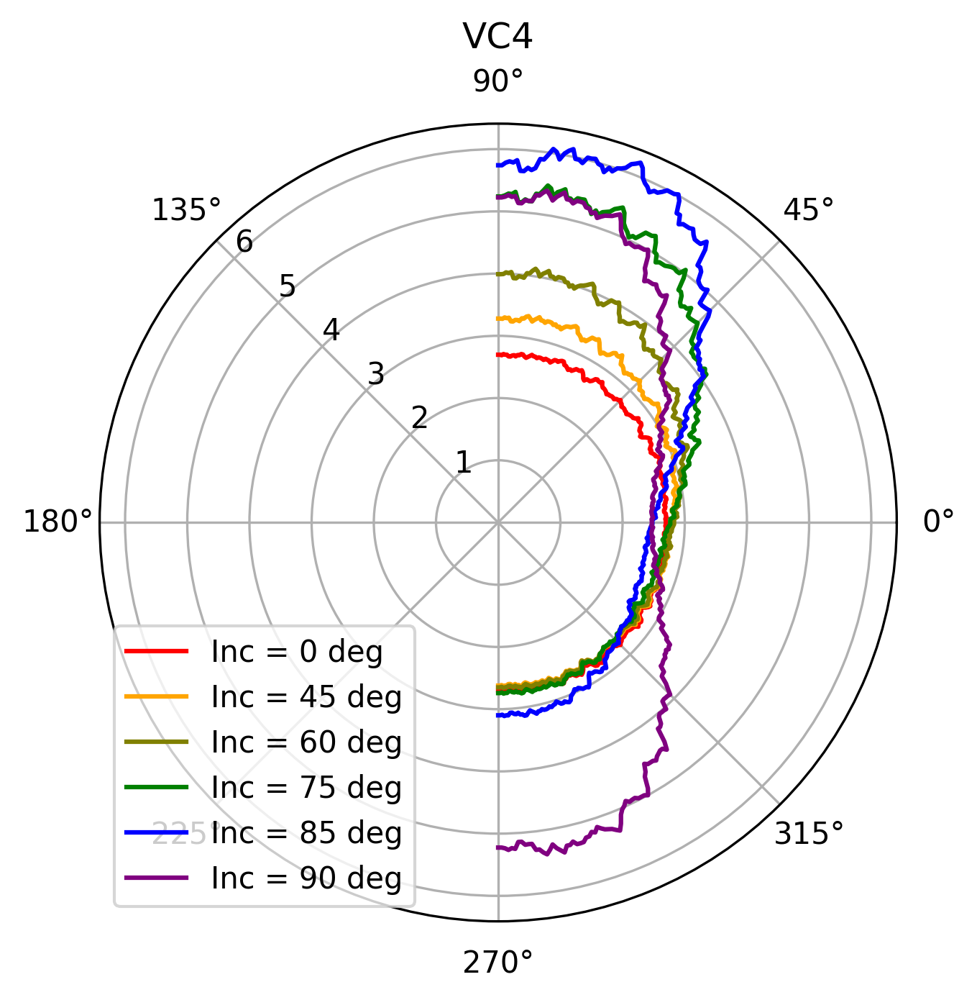

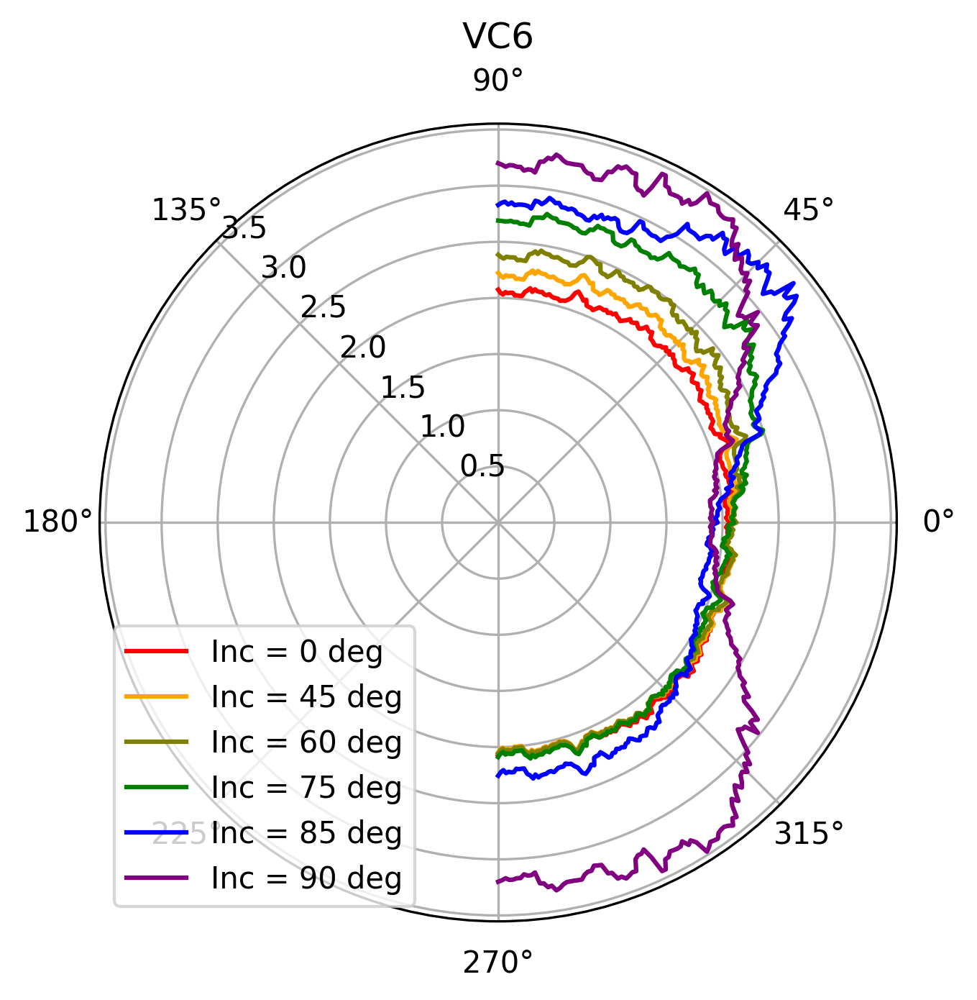

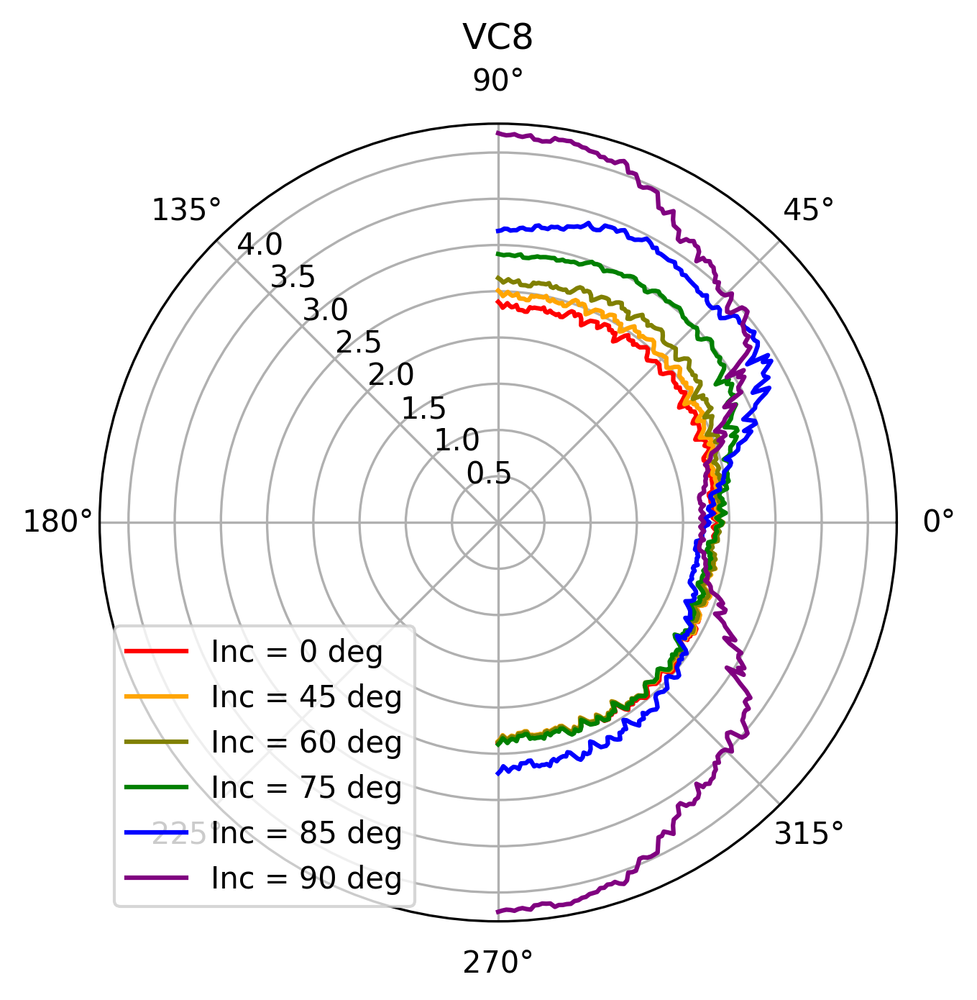

In [71]:
import numpy as np
from hcipy import *
import matplotlib.pyplot as plt
import tables

def vc_correction_factor(charge_number, disk_imgs, disk_imgs_iwa, inc_list, angles_number, accuracy = 0.00001, target_pixel = 455, psf_range = 36.0):
    '''
    Calculate the correction factor for a given image.

    Args:
        charge_number (int): The charge number of the vortex coronagraph.
        disk_img (np.ndarray): The image of the disk model.
        disk_img_iwa (np.ndarray): The image of the disk model ignoring the dust inside IWA.
        telescope_size (float): The size of the telescope in meter.
        psf_scale_as (float): The scale of the PSF in arcsec per pixel.
        wavelength (float): The wavelength of the image in meter.
        angles (list): The angles to calculate the correction factor.
        accuracy (float): The accuracy of the dichotomy method.
        target_pixel (int): The pixel number of the target image in the x-direction and y-direction.
        psf_range (float): The range of the PSF in lambda/D.
    
    Returns:
        np.ndarray: The correction factor for the image in different angles.
    '''

    # Create grids and propagator
    pupil_grid = make_pupil_grid(target_pixel*2, 1.5)
    focal_grid_resolution = target_pixel/2/psf_range
    focal_grid = make_focal_grid(focal_grid_resolution, psf_range)
    prop = FraunhoferPropagator(pupil_grid, focal_grid)

    # Create a Lyot mask and coronagraph
    lyot_mask = evaluate_supersampled(make_circular_aperture(0.95), pupil_grid, 4)
    coro = VortexCoronagraph(pupil_grid, charge=charge_number)
    lyot_stop = Apodizer(lyot_mask)

    # Create an aperture using the hcipy library
    aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)

    def vc_psf(pos_x, pos_y):
        # Calculate Wavefront for (pos_x, pos_y)
        Wavefront_pos = aperture * np.exp(2j * np.pi * (pupil_grid.x * pos_x + pupil_grid.y * pos_y))
        #print(pupil_grid.x, pupil_grid.y)
        wf = Wavefront(Wavefront_pos)
        img = prop(lyot_stop(coro(wf))).intensity.to_dict()["values"].reshape(target_pixel, target_pixel)
        return img
    
    def core_throughput(psf):
        """
        Calculate the core throughput of a PSF

        Args:
            psf (numpy.ndarray): The normalized PSF

        Returns:
            np.float64: The core throughput of the psf
        """
        threshold = 0.5*psf.max()
        core_flux = np.where(psf > threshold , psf, 0)
        return np.sum(core_flux)

    # Calculate the maximum core throughput
    core_throughput_max = core_throughput(vc_psf(psf_range//2, 0))

    # use dichotomy to find the IWA, whose core throughput is half of the maximum
    left = 0
    right = psf_range//2
    while right - left > accuracy:
        mid = (left + right) / 2
        if core_throughput(vc_psf(mid, 0)) > 0.5*core_throughput_max:
            right = mid
        else:
            left = mid
    iwa_ld = (left + right) / 2

    # Create the psfs on the IWA
    angles = np.linspace(-0.5*np.pi, 0.5*np.pi, angles_number)
    # corresponding pos
    iwa_pos_x = iwa_ld*np.cos(angles)
    iwa_pos_y = iwa_ld*np.sin(angles)
    
    # Calculate the psfs on the IWA
    iwa_psfs = np.array([vc_psf(iwa_pos_x[i], iwa_pos_y[i]) for i in range(angles_number)])
    
    # Create core throughput mask
    threshold = 0.5*iwa_psfs.max(axis=(1,2))
    planet_mask = np.where(iwa_psfs > threshold.reshape(-1,1,1), 1, 0)

    # Img number
    img_number = len(disk_imgs)

    # Create the average correction factors array
    avg_correction_factors = np.empty(img_number)

    # plot the correction factors vs angles in a polar plot
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, dpi=300)
    #ax.set_rmax(2)
    #ax.set_rticks([0.5, 1, 1.5, 2])  # Less radial ticks
    ax.set_rlabel_position(135)
    ax.grid(True)
    ax.set_title(f"VC{charge_number}")
    # set color cycle
    colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors
    
    # Calculate the correction factors
    j = 0
    for i in range(img_number):
        correction_factors = np.sum(planet_mask*disk_imgs[i], axis=(1,2))/np.sum(planet_mask*disk_imgs_iwa[i], axis=(1,2))
        avg_correction_factors[i] = np.mean(correction_factors)
        if i in [0,3,4,5,6,7]:
            # plot the correction factors vs angles in a polar plot
            ax.plot(-angles, correction_factors, label=f"Inc = {inc_list[i%len(inc_list)]} deg", color=colors[j])
            j+=1
        
        # plot the average correction factor line
        #ax.plot(angles, avg_correction_factors[i]*np.ones(angles_number), linestyle='--', color='grey', label='Angular Average')
        
    # Add legend
    ax.legend(loc='lower left')
    # Save the figure with the specified name
    fig.savefig(f"figures/correction_factors_ang.png", format='png', bbox_inches='tight')
    # Display the plot
    plt.show()
         
    return avg_correction_factors
inc_list = [0, 15, 30, 45, 60, 75, 85, 90]
charge_number_list = [2, 4, 6, 8]
#charge_number_list = [6]
vc_correction_factors = np.empty([4, 64])
with tables.open_file('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for i in range(len(charge_number_list)):
        charge_number = charge_number_list[i]
        vc_correction_factors[i] = vc_correction_factor(charge_number, fitsh5.root["c"+str(charge_number)], fitsh5.root["c"+str(charge_number)+"iwa"], inc_list, 301)

In [22]:
def planet_plot(disk_img, disk_img_iwa, img_pixel, star_par, planet_par, coronagraph_par, planet_range, x_psfs):
    """
    Make an image of the brightness of an exoplanet and dust when the planet moves along the x-axis.

    Args:
        disk_img (np.ndarray): The image of the disk through the coronagraph.
        disk_img (np.ndarray): The image of the disk through the coronagraph but ignoring dust inside IWA.
        img_pixel (int): The number of pixels in the image along one axis.
        star_par (tuple): Temperature (K), radius (km), and distance (pc) of the star.
        planet_par (tuple): Size (km), reference orbit radius (au), and bond albedo of the planet.
        coronagraph_par (tuple): Telescope diameter (m), psf_scale (arcsec/pixel) and the observing wavelength (nm).
        planet_range (float): The range of the planet's possible locations in au.
        x_psfs (np.ndarray): The psf images along the x-axis.
        
    Returns:
        plot image
    """
    # Unpack the parameters
    star_temp, star_radius, sys_distance = star_par
    planet_size, albedo = planet_par
    telescope_size, psf_scale_as, wavelength = coronagraph_par

    # Unit conversion
    psf_scale_au = psf_scale_as*sys_distance

    # Calculate the star brightness
    star_brightness = blackbody_brightness(wavelength, star_temp, star_radius, sys_distance, np.pi*(telescope_size/2)**2)

    # Calculate the planet positions
    max_pos_pixel = int(min(img_pixel/2, planet_range/psf_scale_au))+1
    iwa = cir_iwa(x_psfs)
    planet_pos_pixel = np.array(range(iwa, max_pos_pixel))
    planet_pos_au = planet_pos_pixel*psf_scale_au
    
    # Calculate the planet filter
    planet_brightness = exoplanet_brightness(star_brightness, albedo, planet_pos_au, planet_size)
    planet_img = np.einsum("i,ijk->ijk",planet_brightness, x_psfs[iwa:max_pos_pixel])
    threshold = 0.5*planet_img.max(axis=(1,2))
    planet_filter = np.where(planet_img > threshold.reshape(-1,1,1) , 1, 0)

    # Calculate the brightness of the planet and dust
    planet_brightness = np.sum(np.multiply(planet_filter, planet_img), axis=(1,2))
    dust_brightness = np.sum(np.multiply(planet_filter, disk_img), axis=(1,2))*psf_scale_as**2
    dust_brightness_iwa = np.sum(np.multiply(planet_filter, disk_img_iwa), axis=(1,2))*psf_scale_as**2

    return iwa, star_brightness, planet_pos_au, planet_brightness, dust_brightness, dust_brightness_iwa

In [23]:
import re
def divstr(fits_name):
    # Define a regular expression pattern to match the parts of the FITS name
    pattern = r'(\d+)([A-Z]+)(\d+)'

    # Use re.match to find the first match in the string
    match = re.match(pattern, fits_name)

    if match:
        # Extract the parts from the match object
        observing_wavelength = match.group(1)
        telescope_name = match.group(2)
        inclination_degree = match.group(3)

        return (telescope_name, observing_wavelength, inclination_degree)
    else:
        # Return None if no match is found
        return None

In [25]:
import tqdm
import numpy as np
import tables

charge_values = [2, 4, 6, 8, 10, 12]  # Add more charge values as needed
star_par = solar_T, solar_R, system_d
planet_par = jupiter_size, jupiter_bond_albedo
correction_factors = np.empty([len(charge_values), pre_img_number])
with tables.open_file('/mnt/chia/vortex_36_455.h5', 'r') as psfh5, tables.open_file('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number in tqdm.tqdm(range(pre_img_number), position=0, leave=True):
        telescope_name, observing_wavelength, inclination_degree = divstr(fits_names[img_number])
        # Define the list of charge values you want to plot
        coronagraph_par = telescope_sizes[img_number], psf_scales[img_number], img_wavelengths_nm[img_number]
        
        # Set the y-axis to log scale
        for i, charge in enumerate(charge_values):
            # Read psfs
            psfs_all = psfh5.root['c' + str(charge)]
            iwa, star_brightness, planet_pos_au, planet_brightness, dust_brightness, dust_brightness_iwa = planet_plot(fitsh5.root["c" + str(charge)][img_number],
                                                                                                fitsh5.root["c" + str(charge) + "iwa"][img_number],
                                                                                                target_pixel, star_par, planet_par, coronagraph_par,
                                                                                                5.35, psfs_all[:, 0])
            
            # Calculate the IWA for each charge
            iwa_au = iwa * psf_scales[img_number] * 10
        
            # Calculate the correction factors
            correction_factors[i][img_number] = (dust_brightness[0]/dust_brightness_iwa[0])

100%|██████████| 64/64 [03:04<00:00,  2.89s/it]


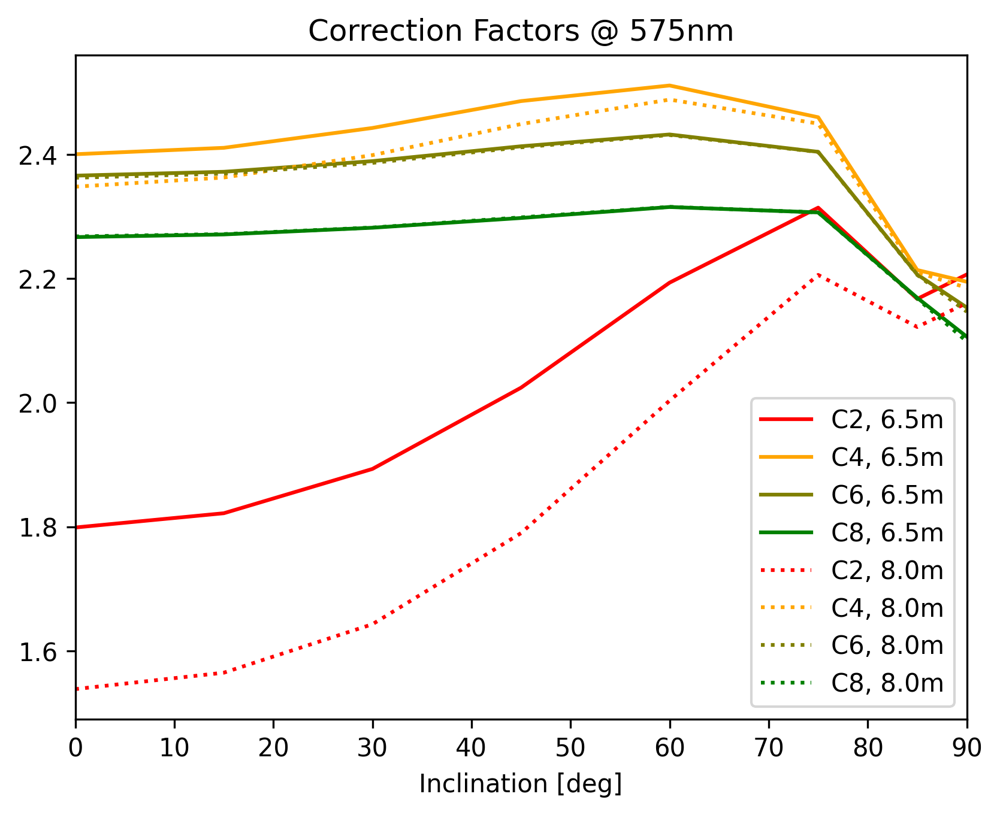

In [27]:
fig = plt.figure(dpi=300)
axs = plt.gca()
#axs.set_ylabel('')
axs.set_xlabel('Inclination [deg]')
# Create a list of colors for plotting
colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors
# Plot the correction factors for each inclination for 6.5m aperture
for i, charge in enumerate(charge_values[:4]):
    plt.plot([0,15,30,45,60,75,85,90], correction_factors[i][:8], label=f"C{charge}, 6.5m", color=colors[i])
# Plot the correction factors for each inclination for 8.0m aperture
for i, charge in enumerate(charge_values[:4]):
    plt.plot([0,15,30,45,60,75,85,90], correction_factors[i][8:16], label=f"C{charge}, 8.0m", linestyle=':', color=colors[i])
plt.xlim(0,90)
plt.title("Correction Factors @ 575nm")
plt.legend()
fig.savefig("figures/correction_factors_575.png".format(fits_names[img_number]), format='png', bbox_inches='tight')
plt.show()

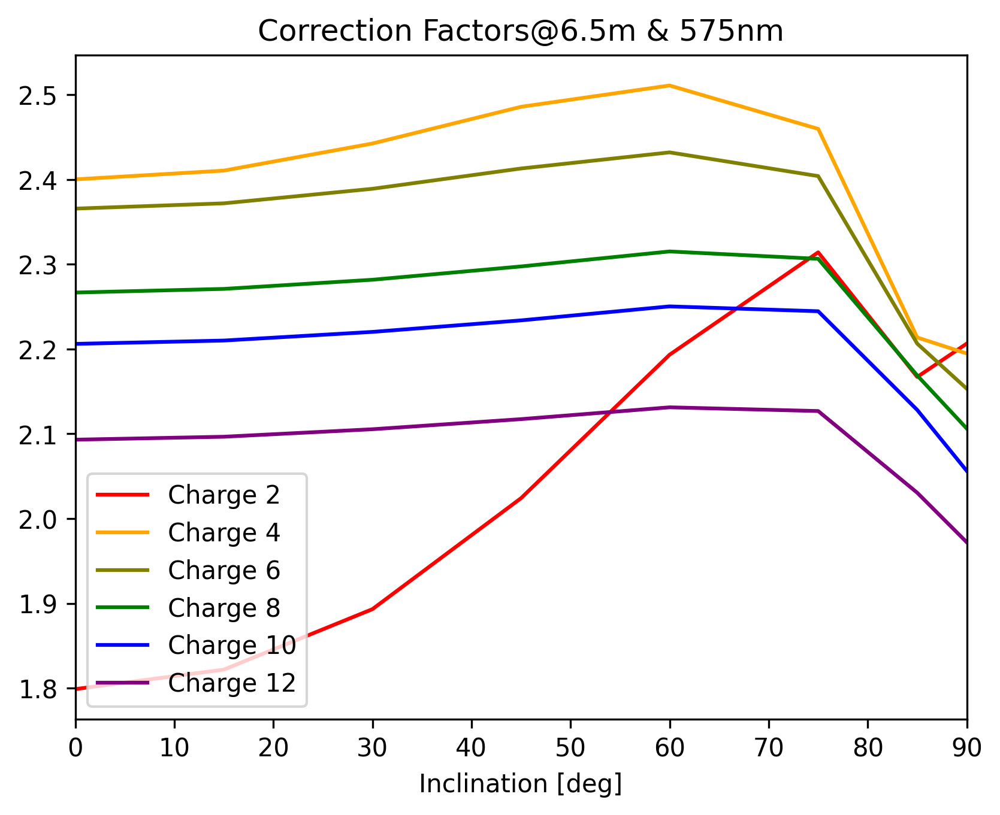

In [ ]:
fig = plt.figure(dpi=300)
axs = plt.gca()
#axs.set_ylabel('')
axs.set_xlabel('Inclination [deg]')
# Create a list of colors for plotting
colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors
for i, charge in enumerate(charge_values):
    # Plot the dust brightness for each charge
    plt.plot([0,15,30,45,60,75,85,90], correction_factors[i][0:8], label=f"Charge {charge}", color=colors[i])
plt.xlim(0,90)
plt.title("Correction Factors@6.5m & 575nm")
plt.legend()
fig.savefig("figures/correction_factors_6575.png".format(fits_names[img_number]), format='png', bbox_inches='tight')
plt.show()

100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


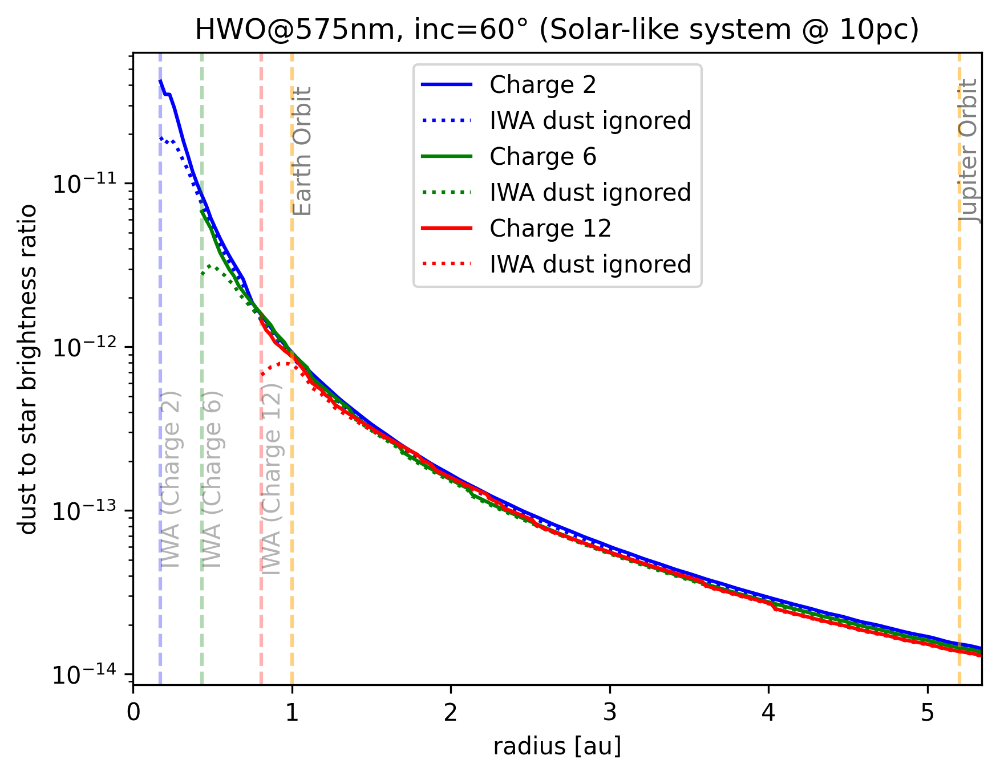

In [ ]:
import tqdm
import numpy as np
import tables

with tables.open_file('/mnt/chia/vortex_36_455.h5', 'r') as psfh5, tables.open_file('Toy_Coronagraph/tests/vortex_455_fits.h5', 'r') as fitsh5:
    for img_number in tqdm.tqdm([4], position=0, leave=True):
        # Define the list of charge values you want to plot
        charge_values = [2, 6, 12]  # Add more charge values as needed
        star_par = solar_T, solar_R, system_d
        planet_par = jupiter_size, jupiter_bond_albedo
        coronagraph_par = telescope_sizes[img_number], psf_scales[img_number], img_wavelengths_nm[img_number]
        
        # Create a list of colors for plotting
        colors = ['b', 'g', 'r']  # You can customize the colors
        
        # Create a new figure
        plt.ioff()
        fig = plt.figure(dpi=300)
        axs = plt.gca()
        axs.set_ylabel('dust to star brightness ratio')
        plt.yscale("log")
        axs.set_xlabel('radius [au]')
        
        # Set the y-axis to log scale
        for charge in charge_values:
            # Read psfs
            psfs_all = psfh5.root['c' + str(charge)]
            iwa, star_brightness, planet_pos_au, planet_brightness, dust_brightness, dust_brightness_iwa = planet_plot(fitsh5.root["c" + str(charge)][img_number],
                                                                                                fitsh5.root["c" + str(charge) + "iwa"][img_number],
                                                                                                target_pixel, star_par, planet_par, coronagraph_par,
                                                                                                5.35, psfs_all[:, 0])
            
            # Calculate the IWA for each charge
            iwa_au = iwa * psf_scales[img_number] * 10
        
            # Plot the dust brightness for each charge
            plt.plot(planet_pos_au, dust_brightness/star_brightness, label=f"Charge {charge}", color=colors[charge_values.index(charge)])
            plt.plot(planet_pos_au, dust_brightness_iwa/star_brightness, label=f"IWA dust ignored", linestyle=':', color=colors[charge_values.index(charge)])
        
            # Plot the reference line for the IWA
            plt.axvline(x=iwa_au, linestyle='--', color=colors[charge_values.index(charge)], alpha=0.3)
            plt.text(iwa_au, 0.005*np.mean(plt.ylim()), f"IWA (Charge {charge})", rotation=90, verticalalignment='center', alpha=0.3)
        
        ref_orbit_radius = {"Earth Orbit":1.0, "Jupiter Orbit":5.2}
        for name, radius in ref_orbit_radius.items():
            # Plot the reference line for the planet
            plt.axvline(x=radius, linestyle='--', color='orange', alpha=0.5)
            # Plot the reference lines
            plt.text(radius, 0.5*np.mean(plt.ylim()), name, rotation=90, verticalalignment='center', alpha=0.5)
        
        axs.set_xlim(0.0, planet_pos_au[-1])
        plt.title("{}@{}nm, inc={}\N{degree sign} (Solar-like system @ 10pc)".format(*divstr(fits_names[img_number])))
        plt.legend()
        #fig.savefig("dust_to_star/{}_dts.png".format(fits_names[img_number]), format='png', bbox_inches='tight')
    plt.show()

# APLC

In [56]:
def downsample_image(image, n, final_size):
    """Downsamples a 1D or 2D NumPy array by combining n^2 pixels into 1 pixel

    Args:
        image: A 1D or 2D NumPy array representing the image.

    Returns:
        A 2D NumPy array representing the downsampled image.
    """
    # Reshape the image into a 3D array
    image = image.reshape(final_size, n, final_size, n)

    # Average the pixels in each block
    return image.sum(axis=(1, 3))

In [57]:
%%time
import multiprocessing as mp
import itertools
import numpy as np
from astropy.io import fits
import h5py
target_pixel = 455 # The pixel number of the target image in the x-direction and y-direction
# Calculate the psf scale in arcsecs per pixel
rad_to_arcsecond = 206264.806247
visual_range = 56.875 # in lambda/D

# Example .fits file has unit W/m^2/pixel
# vF_v(W/m^2/pixel) to F_v(Jy/arcsec^2)
light_speed = 299792458 # m/s
jy=10**26 # The conversion factor from W / m^2 / sr / Hz to Jy

pre_img_dir='/mnt/chia/APLC/'
super_sample=3
wavelengths_nm = [575,660,730,825] # meter
Ds = {"HWO":6.5,"LUVOIRB":8} # aperture size in meter
incs = [0, 15, 30, 45, 60, 75, 85, 90]

pre_img_number = len(wavelengths_nm)*len(Ds)*len(incs)
pre_imgs = np.empty([pre_img_number,target_pixel,target_pixel], dtype=np.float64)
psf_scales = np.empty(pre_img_number, dtype=np.float64)
fits_names = np.empty(pre_img_number, dtype=object)
img_wavelengths_nm = np.empty(pre_img_number, dtype=np.uint16)
telescope_sizes = np.empty(pre_img_number, dtype=np.float64)
for i, (wavelength_nm, D_name, inc) in zip(range(pre_img_number), itertools.product(wavelengths_nm, Ds, incs)):
    #print(D, wavelength)
    D = Ds[D_name]
    wavelength = wavelength_nm*1e-9   
    psf_scale = wavelength/D*rad_to_arcsecond*visual_range/target_pixel # arcsec per pixel
    fits_name = str(wavelength_nm)+D_name+str(inc)
    fits_read = fits.open(pre_img_dir+fits_name+".fits")
    super_origin = fits_read[0].data[5,0] # vF_v(W/m^2/pixel)
    origin = downsample_image(super_origin, super_sample, target_pixel)
    
    F_transfer = jy*wavelength/light_speed/psf_scale**2
    F_v = origin*F_transfer # F_v(Jy/arcsec^2)
    pre_imgs[i] = F_v.astype(np.float64)
    psf_scales[i] = psf_scale
    fits_names[i] = fits_name
    img_wavelengths_nm[i] = wavelength_nm
    telescope_sizes[i] = D

CPU times: user 605 ms, sys: 45.6 ms, total: 651 ms
Wall time: 651 ms


100%|██████████| 1/1 [00:00<00:00, 775.86it/s]


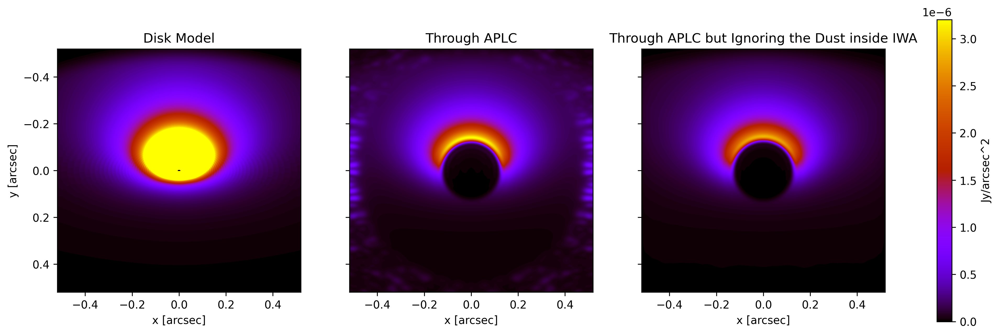

In [58]:
import matplotlib.pyplot as plt
import tqdm
import numpy as np
import tables

# Create a list to store all sub-images
sub_images = []
img_scales = []
img_titles = []
with tables.open_file('/mnt/chia/APLC_fits.h5', 'r') as fitsh5:
    for img_number in tqdm.tqdm([4], position=0, leave=True):
        sub_images.append(pre_imgs[img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Disk Model")
        sub_images.append(fitsh5.root["APLC"][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through APLC")
        sub_images.append(fitsh5.root["APLC_iwa"][img_number])
        img_scales.append(psf_scales[img_number])
        img_titles.append("Through APLC but Ignoring the Dust inside IWA")
    
# Combine all sub-images into a single plot with a shared colorbar
fig, axs = plt.subplots(1, 3, figsize=(17, 5), sharex=True, sharey=True, dpi=300)

# Plot the final image
for i, ax in enumerate(axs):
    # Create a new figure and axes for plotting
    img = ax.imshow(sub_images[i], cmap='gnuplot', vmin = 0, vmax = np.max(sub_images[1:]), extent=img_scales[i]*target_pixel*np.array([-0.5,0.5,-0.5,0.5]))
    ax.set_title(img_titles[i])  # Add title for each plot
    ax.set_xlabel('x [arcsec]')
    if i == 0:
        ax.set_ylabel('y [arcsec]')
    ax.invert_yaxis()
    
# Add color bar
colorbar=plt.colorbar(img, ax=axs.ravel().tolist(), orientation='vertical')
colorbar.set_label(r"Jy/arcsec^2")

plt.show()
fig.savefig("figures/APLCiwa.png", format='png', bbox_inches='tight')

In [59]:
def core_throughput_fun(psfs):
    """
    Calculate the core throughput of a series of PSFs.

    Args:
        psfs (numpy.ndarray): The normalized PSFs.

    Returns:
        numpy.ndarray: The core throughput of the psfs
    """
    psf_len = len(psfs)
    core_throughput = np.empty(psf_len)
    for i in range(psf_len):
        psf_i = psfs[i]
        if i < 25:
            for k in range(target_pixel):
                for j in range(target_pixel):
                    distance = np.linalg.norm([k - target_pixel//2, j - target_pixel//2])
                    if distance > 190:
                        psf_i[k, j] = 0
        threshold = 0.5*psf_i.max()
        core_flux = np.where(psf_i > threshold , psf_i, 0)
        core_throughput[i] = np.sum(core_flux)
    return core_throughput

def cir_iwa(psfs):
    """
    Calculate the inner working angle (IWA) of a series of circular symmetric PSFs.

    Args:
        psfs (numpy.ndarray): The normalized PSFs.

    Returns:
        int: The IWA of the PSFs, in units of pixel.
    """
    core_throughput = core_throughput_fun(psfs)
    iwa = np.searchsorted(core_throughput, 0.5*core_throughput.max())
    return iwa

def cir_core_throughput_plot(psfs, plot_dpi=300):
    """
    Plot the core throughput of a series of circular symmetric PSFs.

    Args:
        psfs (numpy.ndarray): The normalized PSFs.
        plot_dpi (int): Dots per inch (DPI) for the plot.

    Returns:
        Core_throughput.png
    """
    core_throughput = core_throughput_fun(psfs)
    iwa = np.searchsorted(core_throughput, 0.5*core_throughput.max())*visual_range/target_pixel
    # Create a new figure with a specified DPI
    fig = plt.figure(dpi=plot_dpi)
    axs = plt.gca()

    # Set axis labels
    axs.set_ylabel('Throughput')
    axs.set_xlabel((r'Separation [$\lambda$/D]'))

    # Set title
    axs.set_title("APLC")
    
    # Plot the core throughput
    plt.plot(np.arange(len(core_throughput))*visual_range/target_pixel, core_throughput, color='orange')
    plt.xlim(0, len(core_throughput)*visual_range/target_pixel)

    # Print the maximum throughput
    plt.text(0.6, 0.9, f"Max Throughput: {core_throughput.max():.2f}", transform=axs.transAxes)
    
    # Mark the IWA with a black verticle line
    plt.axvline(iwa, color='black', linestyle='--')
    
    # Save the figure with the specified name
    fig.savefig("figures/APLC_throughput.png", format='png', bbox_inches='tight')

    # Display the plot
    plt.show()

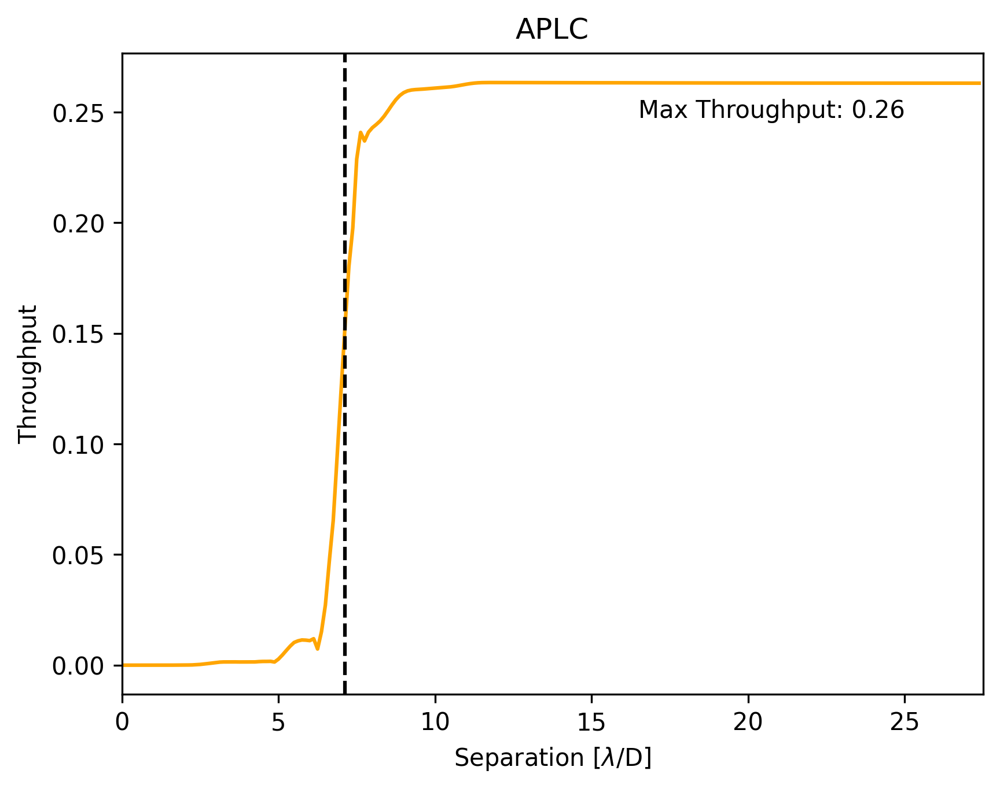

In [60]:
import tables
with tables.open_file('/mnt/chia/APLC.h5', 'r') as psfh5:
    psfs_all = psfh5.root['LUVOIR']
    cir_core_throughput_plot(psfs_all[455*455//2:455*455//2+(455+1)//2-8])

In [61]:
def exoplanet_brightness(star_brightness, albedo, orbit_radius, size):
    '''
    Calculate the planet reflected light brightness.

    Args:
        star_brightness (float): The brightness of the star in Jy.
        albedo (float): The albedo of the planet.
        orbit_radius (float): The radius of the orbit in au.
        size (float): The radius of the planet in km.
    
    Returns:
        float: The brightness of the planet in Jy.
    '''
    # au_to_km 
    orbit_radius = orbit_radius*149597870.7
    return star_brightness*albedo*(size/orbit_radius)**2/8
def blackbody_brightness(lam, T, R, d, A):
    '''
    Calculate the blackbody radiance for a set of wavelengths given a temperature and radiance.

    Parameters
    ---------------
    lam: Reference wavelengths in nm
    T:   Temperature in Kelvin
    R:   Radius in km
    d:   Distance in pc
    A:   Reciever area in m^2

    Output
    ---------------
    Spectral radiance in units of Jy
    '''
    # Convert R in m
    R_m = R * 1e3

    # Convert d in m
    d_m = d * 3.0856775814913673E+16

    # Planck Constant in SI unit
    h = 6.62607015E-34
    
    # Speed of light in m/s
    c = 2.99792458E8

    # Convert wavelength to m
    lam_m = lam * 1E-9

    # Boltzmann Constant in SI unit
    k_B = 1.380649E-23

    # Calculate Radiance B_lam, in units of W/m^2/sr/m
    exponential = (h * c) / (lam_m * k_B * T)
    B = ((2 * h * c) / (lam_m ** 3)) / (np.exp(exponential) - 1)
    # lambda_cutoff=1,alpha=0 to modify in the UV
    # B_lam[x <= lambda_cutoff] *= (x[x <= lambda_cutoff]/lambda_cutoff)**alpha

    # Multiply by the space angle of the star
    omega = np.pi*(R_m/d_m)**2

    # Multiply by the area of the receiver
    return B*omega*A*1e26

In [62]:
# Sun
solar_T = 6000 #Κ
solar_R = 695700 #km
system_d = 10 #pc

# Jupiter
jupiter_size = 69911 #km
jupiter_orbit = 5.20 #au
jupiter_bond_albedo = 0.343	

# Earth
earth_size = 6371 #km
earth_orbit = 1.00 #au
earth_bond_albedo = 0.306

In [ ]:
import matplotlib.pyplot as plt
def planet_plot(disk_img, disk_img_iwa, img_pixel, star_par, planet_par, coronagraph_par, planet_range, x_psfs):
    """
    Make an image of the brightness of an exoplanet and dust when the planet moves along the x-axis.

    Args:
        disk_img (np.ndarray): The image of the disk through the coronagraph.
        disk_img (np.ndarray): The image of the disk through the coronagraph but ignoring dust inside IWA.
        img_pixel (int): The number of pixels in the image along one axis.
        star_par (tuple): Temperature (K), radius (km), and distance (pc) of the star.
        planet_par (tuple): Size (km), reference orbit radius (au), and bond albedo of the planet.
        coronagraph_par (tuple): Telescope diameter (m), psf_scale (arcsec/pixel) and the observing wavelength (nm).
        planet_range (float): The range of the planet's possible locations in au.
        x_psfs (np.ndarray): The psf images along the x-axis.
        
    Returns:
        plot image
    """
    # Unpack the parameters
    star_temp, star_radius, sys_distance = star_par
    planet_size, albedo = planet_par
    telescope_size, psf_scale_as, wavelength = coronagraph_par


    # Unit conversion
    psf_scale_au = psf_scale_as*sys_distance

    # Calculate the star brightness
    star_brightness = blackbody_brightness(wavelength, star_temp, star_radius, sys_distance, np.pi*(telescope_size/2)**2)

    # Calculate the planet positions
    max_pos_pixel = int(min(img_pixel/2, planet_range/psf_scale_au))+1
    iwa = cir_iwa(x_psfs)
    planet_pos_pixel = np.array(range(iwa, max_pos_pixel))
    planet_pos_au = planet_pos_pixel*psf_scale_au
    
    # Calculate the planet filter
    planet_brightness = exoplanet_brightness(star_brightness, albedo, planet_pos_au, planet_size)
    planet_img = np.einsum("i,ijk->ijk",planet_brightness, x_psfs[iwa:max_pos_pixel])
    threshold = 0.5*planet_img.max(axis=(1,2))
    planet_filter = np.where(planet_img > threshold.reshape(-1,1,1) , 1, 0)

    # Calculate the brightness of the planet and dust
    planet_brightness = np.sum(np.multiply(planet_filter, planet_img), axis=(1,2))
    dust_brightness = np.sum(np.multiply(planet_filter, disk_img), axis=(1,2))*psf_scale_as**2
    dust_brightness_iwa = np.sum(np.multiply(planet_filter, disk_img_iwa), axis=(1,2))*psf_scale_as**2

    return iwa, star_brightness, planet_pos_au, planet_brightness, dust_brightness, dust_brightness_iwa

In [64]:
import re
def divstr(fits_name):
    # Define a regular expression pattern to match the parts of the FITS name
    pattern = r'(\d+)([A-Z]+)(\d+)'

    # Use re.match to find the first match in the string
    match = re.match(pattern, fits_name)

    if match:
        # Extract the parts from the match object
        observing_wavelength = match.group(1)
        telescope_name = match.group(2)
        inclination_degree = match.group(3)

        return (telescope_name, observing_wavelength, inclination_degree)
    else:
        # Return None if no match is found
        return None

In [65]:
import tqdm
import numpy as np
import tables

star_par = solar_T, solar_R, system_d
planet_par = jupiter_size, jupiter_bond_albedo
APLC_correction_factors = np.empty([pre_img_number])

with tables.open_file('/mnt/chia/APLC.h5', 'r') as psfh5, tables.open_file('/mnt/chia/APLC_fits.h5', 'r') as fitsh5:
    for img_number in tqdm.tqdm(range(pre_img_number), position=0, leave=True):
        telescope_name, observing_wavelength, inclination_degree = divstr(fits_names[img_number])
        coronagraph_par = telescope_sizes[img_number], psf_scales[img_number], img_wavelengths_nm[img_number]
                
        # Read psfs
        psfs_all = psfh5.root['LUVOIR']
        iwa, star_brightness, planet_pos_au, planet_brightness, dust_brightness, dust_brightness_iwa = planet_plot(fitsh5.root["APLC"][img_number],
                                                                                                fitsh5.root["APLC_iwa"][img_number],
                                                                                                target_pixel, star_par, planet_par, coronagraph_par,
                                                                                                5.5, psfs_all[455*455//2:455*455//2+(455+1)//2])
            
        # Calculate the IWA in au
        iwa_au = iwa * psf_scales[img_number] * 10
        
        # Calculate the correction factors
        APLC_correction_factors[img_number] = (dust_brightness[0]/dust_brightness_iwa[0])
        '''
        # Plot the dust brightness
        plt.plot(planet_pos_au, dust_brightness/star_brightness, color='r')
        plt.plot(planet_pos_au, dust_brightness_iwa/star_brightness, label=f"IWA dust ignored", linestyle=':', color='r')
        
        # Plot the reference line for the IWA
        plt.axvline(x=iwa_au, linestyle='--', color='r', alpha=0.3)
        plt.text(iwa_au, 0.5*np.mean(plt.ylim()), f"IWA", rotation=90, verticalalignment='center', alpha=0.3)
        
        ref_orbit_radius = {"Earth Orbit":1.0, "Jupiter Orbit":5.2}
        for name, radius in ref_orbit_radius.items():
            # Plot the reference line for the planet
            plt.axvline(x=radius, linestyle='--', color='orange', alpha=0.5)
            # Plot the reference lines
            plt.text(radius, 0.5*np.mean(plt.ylim()), name, rotation=90, verticalalignment='center', alpha=0.5)
        
        axs.set_xlim(0.0, planet_pos_au[-1])
        plt.title("{}@{}nm, inc={}\N{degree sign} (Solar-like system @ 10pc)".format(*divstr(fits_names[img_number])))
        plt.legend()
        fig.savefig("/mnt/chia/APLC/dust_to_star/{}_dts.png".format(fits_names[img_number]), format='png', bbox_inches='tight')
        plt.close()
        '''

100%|██████████| 64/64 [00:25<00:00,  2.48it/s]


In [66]:
# Create a list of colors for plotting
colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors
for ini_img_number in [0,16,32,48]:
    fig = plt.figure(dpi=300)
    axs = plt.gca()
    #axs.set_ylabel('')
    axs.set_xlabel('Inclination [deg]')
    # Plot the correction factors for each inclination for 6.5m aperture
    plt.plot([0,15,30,45,60,75,85,90], APLC_correction_factors[ini_img_number:ini_img_number+8], label=f"6.5m", color=colors[i])

    # Plot the correction factors for each inclination for 8.0m aperture
    plt.plot([0,15,30,45,60,75,85,90], APLC_correction_factors[ini_img_number+8:ini_img_number+16], label=f"8.0m", linestyle=':', color=colors[i])

    plt.xlim(0,90)
    plt.title("Correction Factors @ {}nm".format(divstr(fits_names[ini_img_number])[1]))
    plt.legend()
    fig.savefig("figures/APLC_correction_factors_{}.png".format(divstr(fits_names[ini_img_number])[1]), format='png', bbox_inches='tight')
    plt.close()

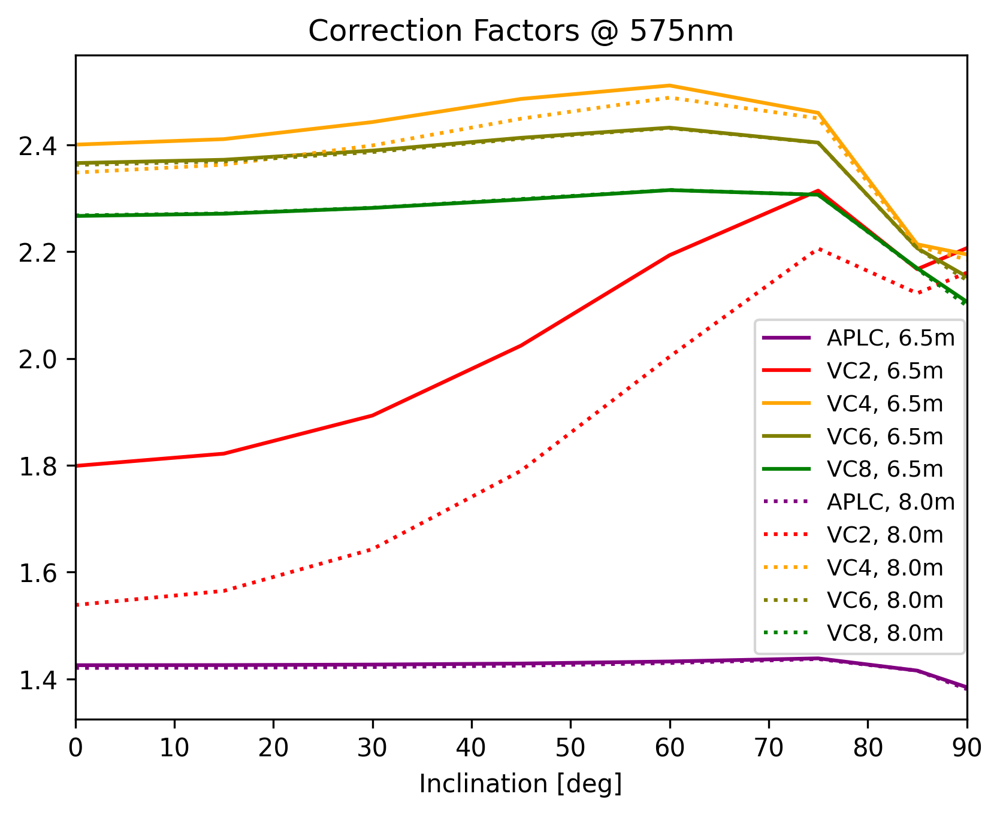

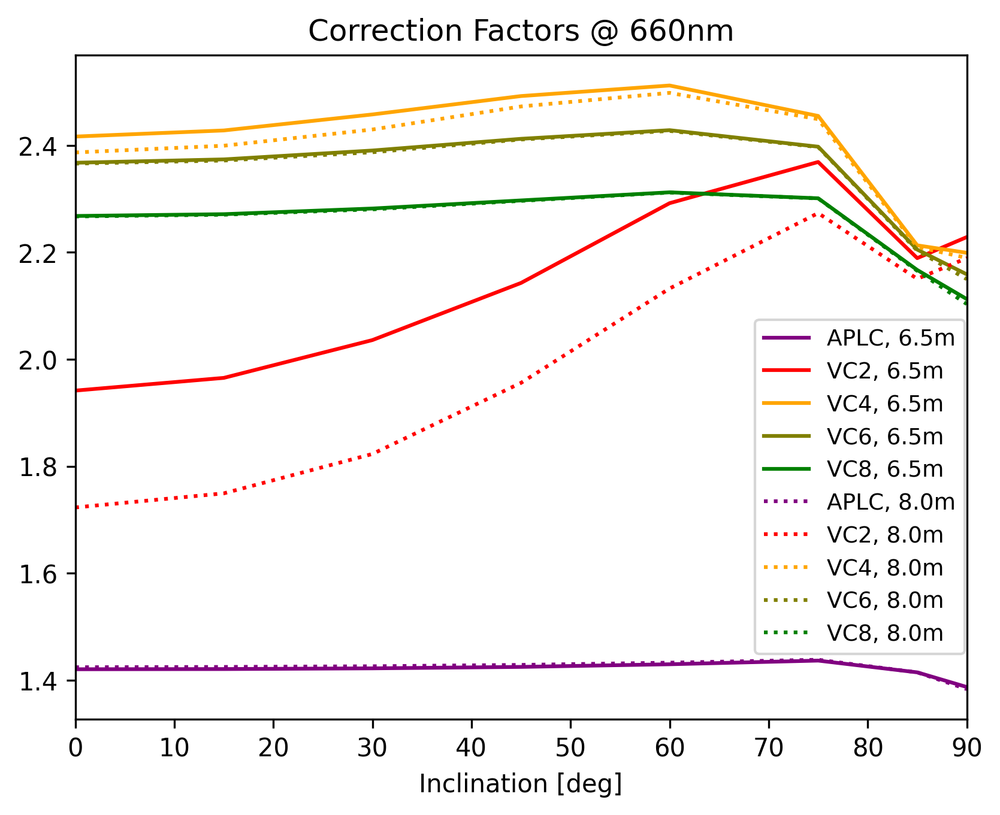

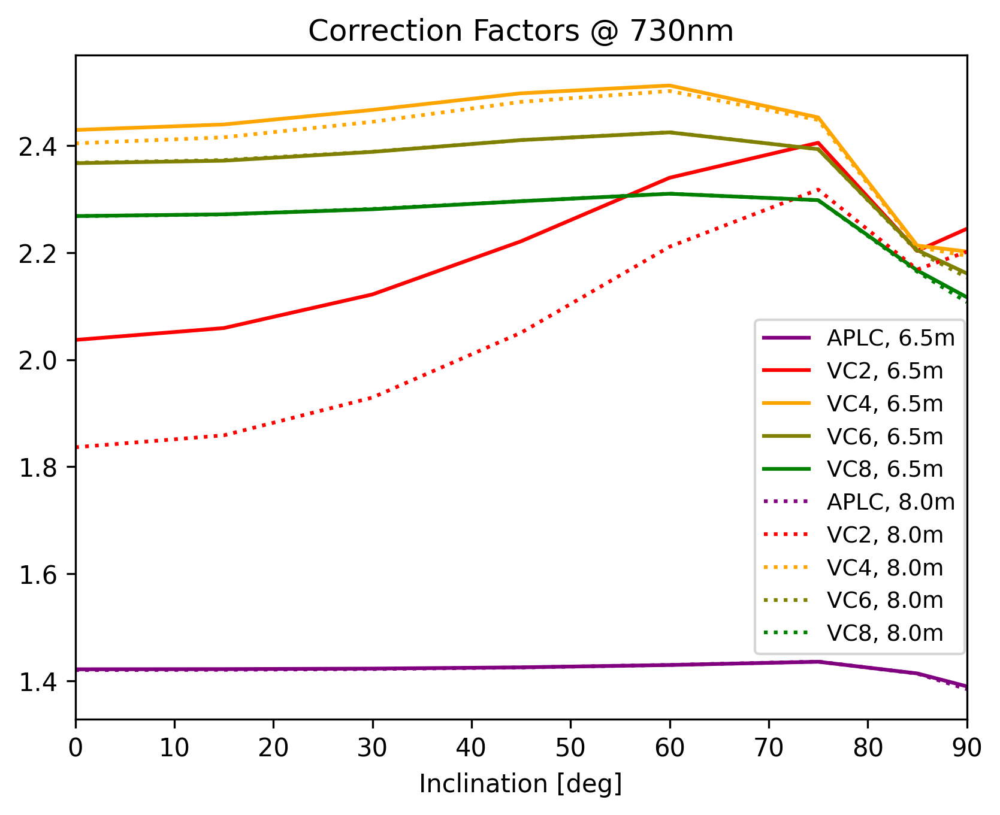

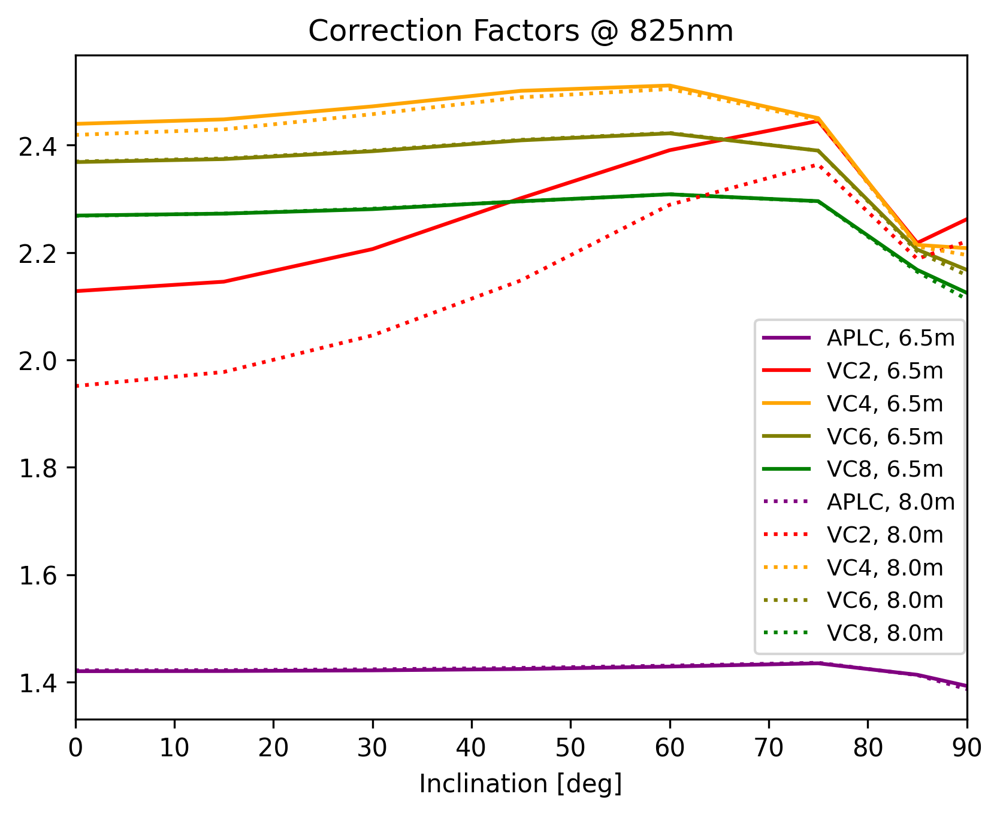

In [ ]:
# Create a list of colors for plotting
from numpy import size

charge_values = [2, 4, 6, 8, 10, 12]  # Recover the charge values
colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors
for ini_img_number in [0,16,32,48]:
    fig = plt.figure(dpi=300)
    axs = plt.gca()
    #axs.set_ylabel('')
    axs.set_xlabel('Inclination [deg]')
    # Plot the correction factors for each inclination for 6.5m aperture
    plt.plot([0,15,30,45,60,75,85,90], APLC_correction_factors[ini_img_number:ini_img_number+8], label=f"APLC, 6.5m", color=colors[-1])
    for i, charge in enumerate(charge_values[:4]):
        plt.plot([0,15,30,45,60,75,85,90], correction_factors[i][ini_img_number:ini_img_number+8], label=f"VC{charge}, 6.5m", color=colors[i])
    # Plot the correction factors for each inclination for 8.0m aperture
    plt.plot([0,15,30,45,60,75,85,90], APLC_correction_factors[ini_img_number+8:ini_img_number+16], label=f"APLC, 8.0m", linestyle=':', color=colors[-1])
    for i, charge in enumerate(charge_values[:4]):
        plt.plot([0,15,30,45,60,75,85,90], correction_factors[i][ini_img_number+8:ini_img_number+16], label=f"VC{charge}, 8.0m", linestyle=':', color=colors[i])
    plt.xlim(0,90)
    plt.title("Correction Factors @ {}nm".format(divstr(fits_names[ini_img_number])[1]))
    # plot the legend to the right part of the plot (0.8, -0.2), set the font size = 10
    plt.legend(loc='center left', bbox_to_anchor=(0.75, 0.35), fontsize=9)
    fig.savefig("figures/correction_factors_{}.png".format(divstr(fits_names[ini_img_number])[1]), format='png', bbox_inches='tight')
    plt.show()

In [ ]:
''' Extract pure ASDF from ASDF-in-FITS
import sys

import asdf
from asdf import AsdfFile
from asdf.fits_embed import AsdfInFits
def extract_file(input_file, output_file):
    """Function for performing extraction from ASDF-in-FITS to pure ASDF."""

    try:
        with asdf.open(input_file) as ih:
            if not isinstance(ih, AsdfInFits):
                msg = "Given input file '{}' is not ASDF-in-FITS"
                raise RuntimeError(msg.format(input_file))

            with asdf.AsdfFile(ih.tree) as oh:
                oh.write_to(output_file)

    except (IOError, ValueError) as error:
        raise RuntimeError(str(error))
extract_file("LUVOIR_BW10_m.fits", "LUVOIR_BW10_m.asdf")
'''

In [68]:
import asdf
import numpy as np
import matplotlib.pyplot as plt
from hcipy import *
solution = asdf.open("LUVOIR_BW10_m.fits")
parameters = solution.tree['parameters']
apodizer = solution.tree['apodizer']
pup_fname = parameters['pupil']['filename']
fpm_radius = parameters['focal_plane_mask']['radius']
fpm_num_pix = parameters['focal_plane_mask']['num_pix']
fpm_grayscale = parameters['focal_plane_mask']['grayscale']
ls_fname = parameters['lyot_stop']['filename']
ls_num_stops = parameters['lyot_stop']['num_lyot_stops']
contrast = parameters['image']['contrast']
owa = parameters['image']['owa']
# focal_grid
focal_grid = make_focal_grid(8, owa * 1.2)  # make_focal_grid(q, fov) - grid for a focal plane

# pupil
pupil = read_fits(pup_fname)
num_pix = pupil.shape[0]
pupil_grid = make_uniform_grid(num_pix, [1, 1])
pupil = Field(pupil.ravel(), pupil_grid)
apodizer = Field(apodizer.ravel(), pupil_grid)

# focal_plane_mask
q_foc = fpm_num_pix / (fpm_radius * 2)
x_foc = (np.arange(fpm_num_pix) + 0.5 - fpm_num_pix / 2) / q_foc
focal_mask_grid = CartesianGrid(RegularCoords(1.0 / q_foc, [fpm_num_pix, fpm_num_pix], x_foc.min()))
if fpm_grayscale:
    focal_plane_mask = 1 - evaluate_supersampled(make_circular_aperture(2 * fpm_radius), focal_mask_grid, 8)
else:
    focal_plane_mask = 1 - make_circular_aperture(2 * fpm_radius)(focal_mask_grid)

# lyot_stop
lyot_stops = [Field(read_fits(ls_fname.format(i)).ravel(), pupil_grid) for i in range(ls_num_stops)]
lyot_stop = lyot_stops[0]

# coro
coro = LyotCoronagraph(pupil.grid, focal_plane_mask, lyot_stop)

#prop
prop = FraunhoferPropagator(pupil.grid, focal_grid)

def psfs_maker(x,y):
    # wf
    wf = Wavefront(pupil * np.exp(2j * np.pi * (pupil.grid.x * x + pupil.grid.y * y))* apodizer)
    
    # img
    img = prop(coro(wf)).intensity
    # Convert the image to a numpy array
    return img.to_dict()["values"].reshape(455, 455)

In [13]:
import numpy as np
from hcipy import *
import matplotlib.pyplot as plt
import tables

def APLC_iwa(accuracy = 0.00001, psf_range = 28.4375):
    def core_throughput(psf):
        """
        Calculate the core throughput of a PSF

        Args:
            psf (numpy.ndarray): The normalized PSF

        Returns:
            np.float64: The core throughput of the psf
        """
        threshold = 0.5*psf.max()
        core_flux = np.where(psf > threshold , psf, 0)
        return np.sum(core_flux)

    # Calculate the maximum core throughput
    core_throughput_max = core_throughput(psfs_maker(psf_range//2, 0))

    # use dichotomy to find the IWA, whose core throughput is half of the maximum
    left = 0
    right = psf_range//2
    while right - left > accuracy:
        mid = (left + right) / 2
        if core_throughput(psfs_maker(mid, 0)) > 0.5*core_throughput_max:
            right = mid
        else:
            left = mid
    iwa_ld = (left + right) / 2
    return iwa_ld
# test
print(APLC_iwa())

7.025023937225342


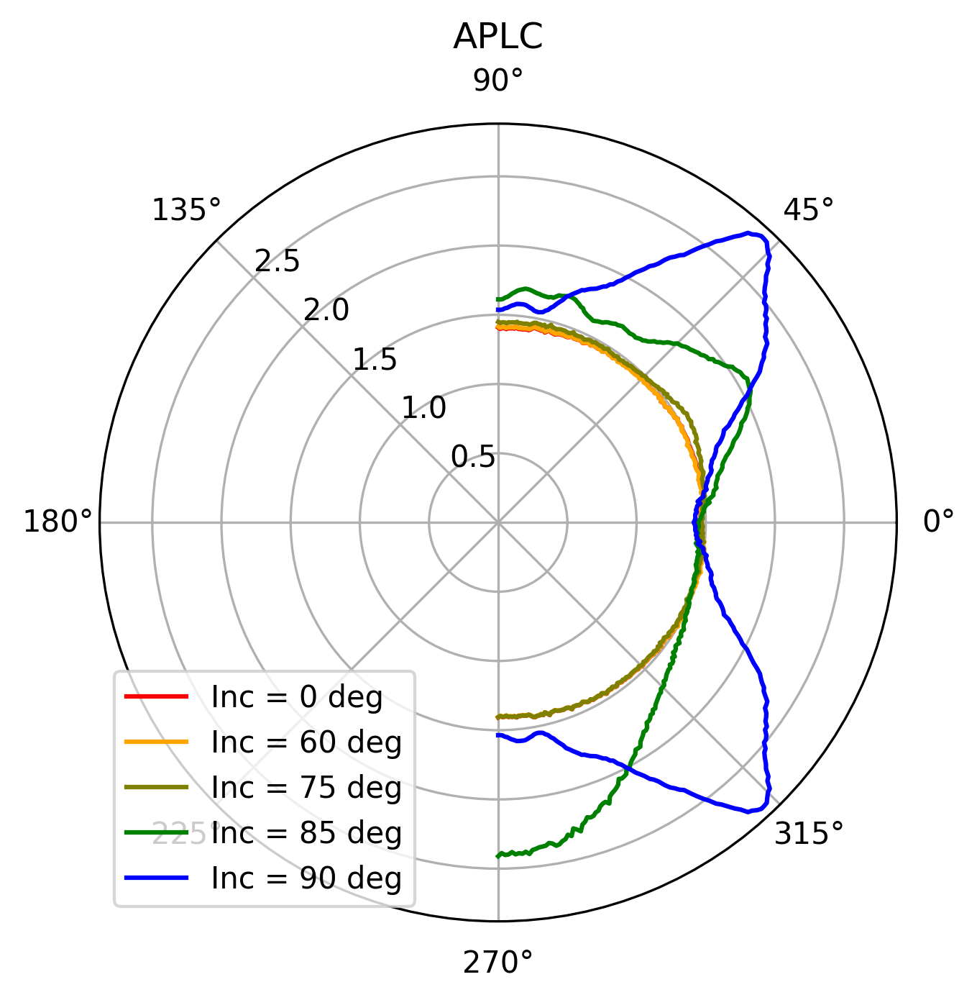

In [69]:
import numpy as np
from hcipy import *
import matplotlib.pyplot as plt
import tables

def aplc_correction_factor(disk_imgs, disk_imgs_iwa, inc_list, angles_number, accuracy = 0.00001, psf_range = 36.0):
    def core_throughput(psf):
        """
        Calculate the core throughput of a PSF

        Args:
            psf (numpy.ndarray): The normalized PSF

        Returns:
            np.float64: The core throughput of the psf
        """
        threshold = 0.5*psf.max()
        core_flux = np.where(psf > threshold , psf, 0)
        return np.sum(core_flux)

    # Calculate the maximum core throughput
    core_throughput_max = core_throughput(psfs_maker(psf_range//2, 0))

    # use dichotomy to find the IWA, whose core throughput is half of the maximum
    left = 0
    right = psf_range//2
    while right - left > accuracy:
        mid = (left + right) / 2
        if core_throughput(psfs_maker(mid, 0)) > 0.5*core_throughput_max:
            right = mid
        else:
            left = mid
    iwa_ld = (left + right) / 2

    # Create the psfs on the IWA
    angles = np.linspace(-0.5*np.pi, 0.5*np.pi, angles_number)
    
    # corresponding pos
    iwa_pos_x = iwa_ld*np.cos(angles)
    iwa_pos_y = iwa_ld*np.sin(angles)
    
    # Calculate the psfs on the IWA
    iwa_psfs = np.array([psfs_maker(iwa_pos_x[i], iwa_pos_y[i]) for i in range(angles_number)])
    
    # Create core throughput mask
    threshold = 0.5*iwa_psfs.max(axis=(1,2))
    planet_mask = np.where(iwa_psfs > threshold.reshape(-1,1,1), 1, 0)

    # Img number
    img_number = len(disk_imgs)

    # Create the average correction factors array
    avg_correction_factors = np.empty(img_number)
    
    # plot the correction factors vs angles in a polar plot
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, dpi=300)
    #ax.set_rmax(2)
    #ax.set_rticks([0.5, 1, 1.5, 2])  # Less radial ticks
    ax.set_rlabel_position(135)
    ax.grid(True)
    ax.set_title(f"APLC")
    # set color cycle
    colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors

    # Calculate the correction factors
    j=0
    for i in range(img_number):
        correction_factors = np.sum(planet_mask*disk_imgs[i], axis=(1,2))/np.sum(planet_mask*disk_imgs_iwa[i], axis=(1,2))
        avg_correction_factors[i] = np.mean(correction_factors)
        if i in [0,4,5,6,7]:
            # plot the correction factors vs angles in a polar plot
            ax.plot(-angles, correction_factors, label=f"Inc = {inc_list[i%len(inc_list)]} deg", color=colors[j])
            j+=1
    # Add legend
    ax.legend(loc='lower left')
    # Save the figure with the specified name
    fig.savefig(f"figures/correction_factors_ang_APLC.png", format='png', bbox_inches='tight')
    # Display the plot
    plt.show()
    
    return avg_correction_factors
inc_list = [0, 15, 30, 45, 60, 75, 85, 90]
aplc_correction_factors = np.empty(64)
with tables.open_file('/mnt/chia/APLC_fits.h5', 'r') as fitsh5:
    aplc_correction_factors = aplc_correction_factor(fitsh5.root["APLC"], fitsh5.root["APLC_iwa"], inc_list, 301)

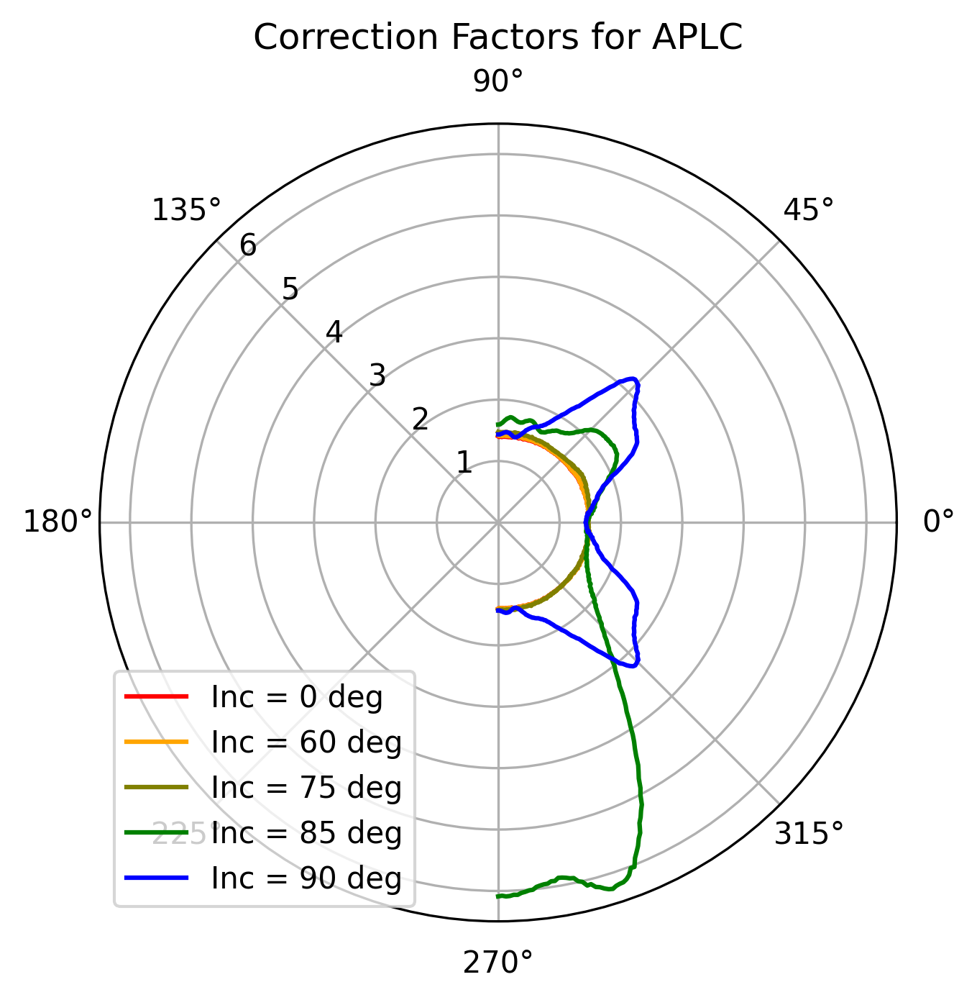

In [29]:
import numpy as np
from hcipy import *
import matplotlib.pyplot as plt
import tables

def aplc_correction_factor(disk_imgs, disk_imgs_iwa, inc_list, angles_number, accuracy = 0.00001, psf_range = 36.0):
    def core_throughput(psf):
        """
        Calculate the core throughput of a PSF

        Args:
            psf (numpy.ndarray): The normalized PSF

        Returns:
            np.float64: The core throughput of the psf
        """
        threshold = 0.5*psf.max()
        core_flux = np.where(psf > threshold , psf, 0)
        return np.sum(core_flux)

    # Calculate the maximum core throughput
    core_throughput_max = core_throughput(psfs_maker(psf_range//2, 0))

    # use dichotomy to find the IWA, whose core throughput is half of the maximum
    left = 0
    right = psf_range//2
    while right - left > accuracy:
        mid = (left + right) / 2
        if core_throughput(psfs_maker(mid, 0)) > 0.5*core_throughput_max:
            right = mid
        else:
            left = mid
    iwa_ld = (left + right) / 2

    # Create the psfs on the IWA
    angles = np.linspace(-0.5*np.pi, 0.5*np.pi, angles_number)
    
    # corresponding pos
    iwa_pos_x = iwa_ld*np.cos(angles)
    iwa_pos_y = iwa_ld*np.sin(angles)
    
    # Calculate the psfs on the IWA
    iwa_psfs = np.array([psfs_maker(iwa_pos_x[i], iwa_pos_y[i]) for i in range(angles_number)])
    
    # Create core throughput mask
    threshold = 0.5*iwa_psfs.max(axis=(1,2))
    planet_mask = np.where(iwa_psfs > threshold.reshape(-1,1,1), 1, 0)

    # Img number
    img_number = len(disk_imgs)

    # Create the average correction factors array
    avg_correction_factors = np.empty(img_number)
    
    # plot the correction factors vs angles in a polar plot
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, dpi=300)
    #ax.set_rmax(2)
    #ax.set_rticks([0.5, 1, 1.5, 2])  # Less radial ticks
    ax.set_rlabel_position(135)
    ax.grid(True)
    ax.set_title(f"Correction Factors for APLC")
    # set color cycle
    colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors

    # Calculate the correction factors
    j=0
    for i in range(img_number):
        correction_factors = np.sum(planet_mask*disk_imgs[i], axis=(1,2))/np.sum(planet_mask*disk_imgs_iwa[i], axis=(1,2))
        avg_correction_factors[i] = np.mean(correction_factors)
        if i in [48,52,53,54,55]:
            # plot the correction factors vs angles in a polar plot
            ax.plot(-angles, correction_factors, label=f"Inc = {inc_list[i%len(inc_list)]} deg", color=colors[j])
            j+=1
    # Add legend
    ax.legend(loc='lower left')
    # Save the figure with the specified name
    #fig.savefig(f"figures/correction_factors_ang_APLC.png", format='png', bbox_inches='tight')
    # Display the plot
    plt.show()
    
    return avg_correction_factors
inc_list = [0, 15, 30, 45, 60, 75, 85, 90]
aplc_correction_factors = np.empty(64)
with tables.open_file('/mnt/chia/APLC_fits.h5', 'r') as fitsh5:
    aplc_correction_factors = aplc_correction_factor(fitsh5.root["APLC"], fitsh5.root["APLC_iwa"], inc_list, 301)

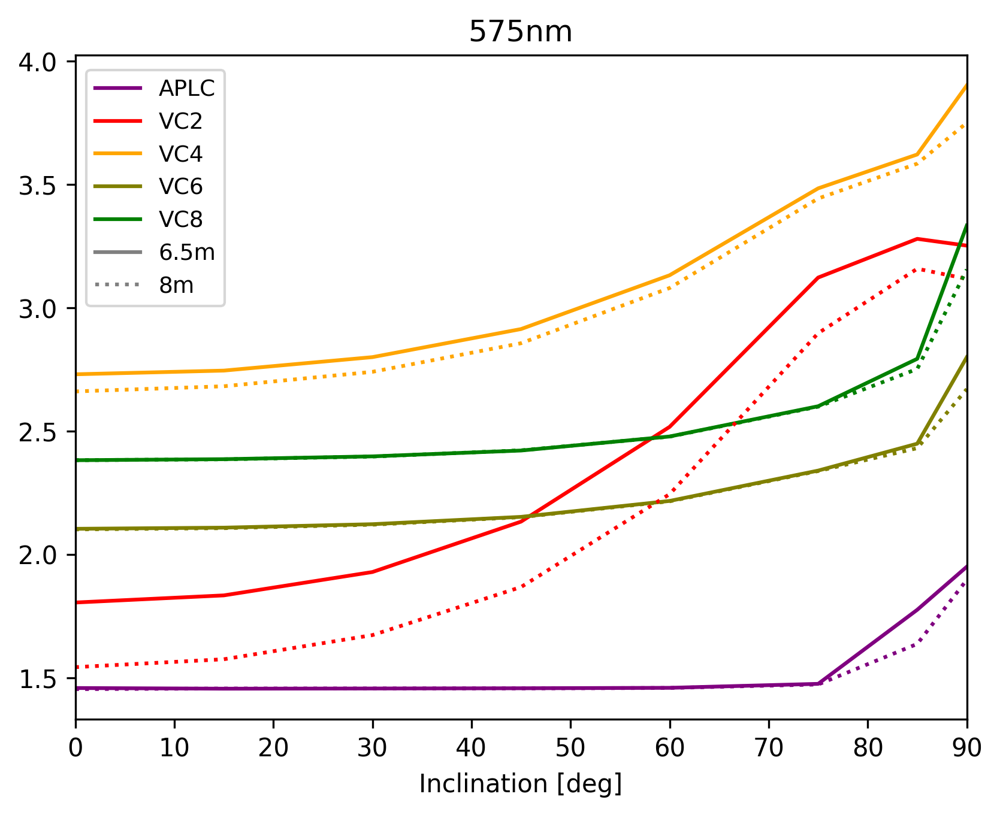

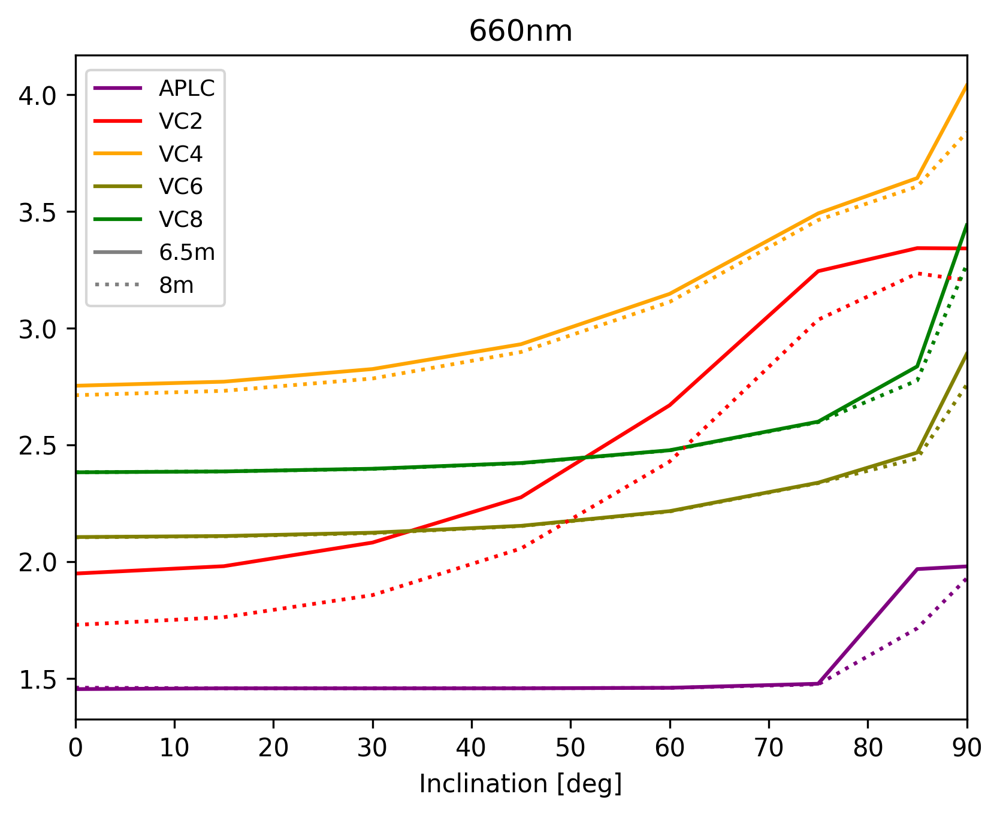

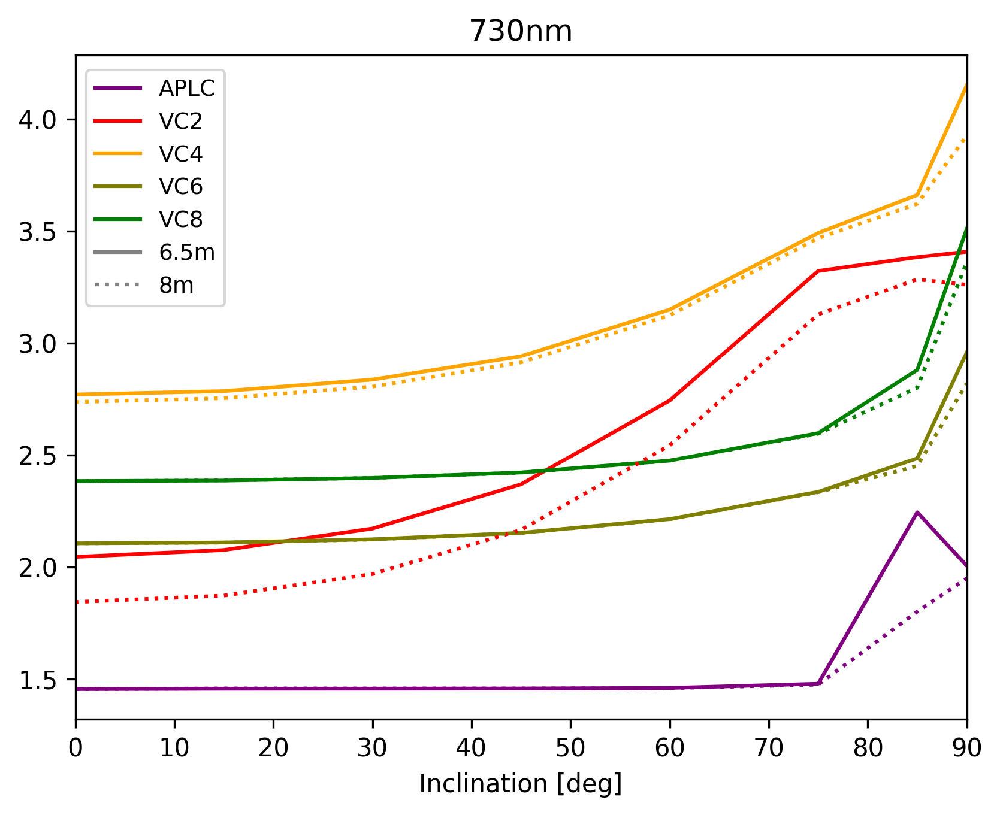

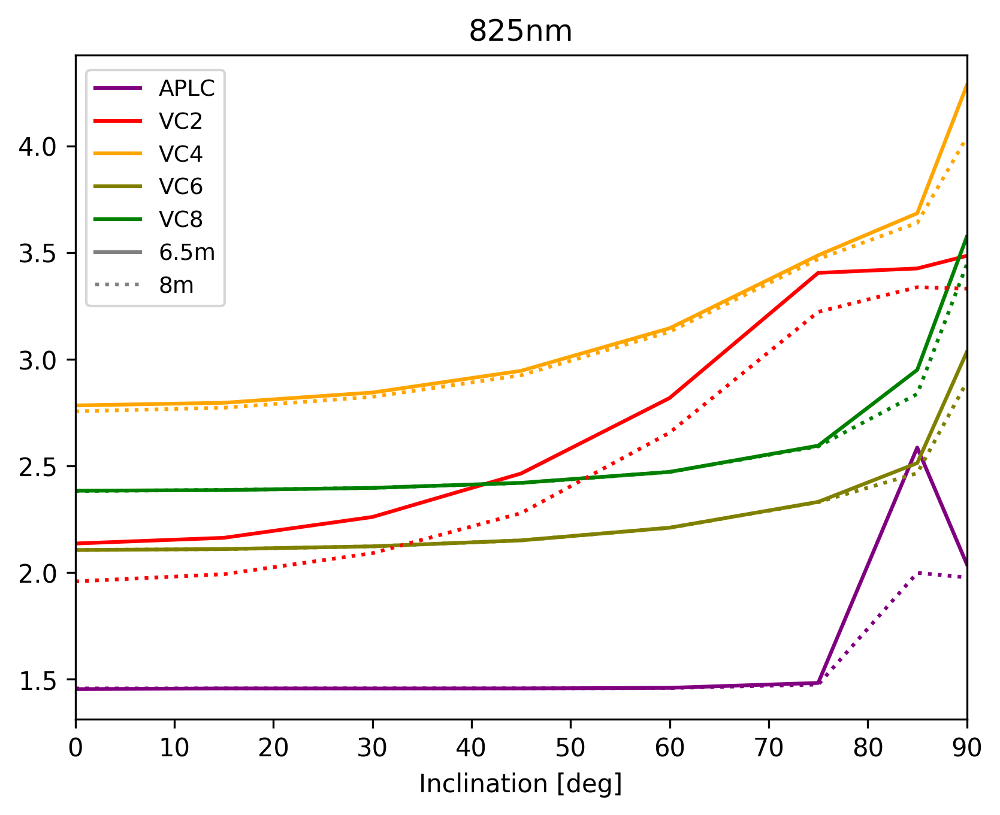

In [72]:
# Create a list of colors for plotting
from tkinter import font
from numpy import size

charge_values = [2, 4, 6, 8, 10, 12]  # Recover the charge values
colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']  # You can customize the colors
for ini_img_number in [0,16,32,48]:
    fig = plt.figure(dpi=300)
    axs = plt.gca()
    #axs.set_ylabel('')
    axs.set_xlabel('Inclination [deg]')
    # Plot the correction factors for each inclination for 6.5m aperture
    plt.plot([0,15,30,45,60,75,85,90], aplc_correction_factors[ini_img_number:ini_img_number+8], label=f"APLC", color=colors[-1])
    for i, charge in enumerate(charge_values[:4]):
        plt.plot([0,15,30,45,60,75,85,90], vc_correction_factors[i][ini_img_number:ini_img_number+8], label=f"VC{charge}", color=colors[i])
    # Plot the correction factors for each inclination for 8.0m aperture
    plt.plot([0,15,30,45,60,75,85,90], aplc_correction_factors[ini_img_number+8:ini_img_number+16], linestyle=':', color=colors[-1])
    for i, charge in enumerate(charge_values[:4]):
        plt.plot([0,15,30,45,60,75,85,90], vc_correction_factors[i][ini_img_number+8:ini_img_number+16], linestyle=':', color=colors[i])
    # add legend to explain dashed line means 8.0m aperture while solid line means 6.5m aperture in one line legend
    plt.plot([], [], linestyle='-', color='gray', label='6.5m')
    plt.plot([], [], linestyle=':', color='gray', label='8m')
    plt.xlim(0,90)
    plt.title("{}nm".format(divstr(fits_names[ini_img_number])[1]))
    # plot the legend to the right part of the plot (0.8, -0.2), set the font size = 10
    plt.legend(loc='center left', bbox_to_anchor=(0, 0.8), fontsize=9)
    fig.savefig("figures/correction_factors_{}.png".format(divstr(fits_names[ini_img_number])[1]), format='png', bbox_inches='tight')
    plt.show()

### Apeature size effect

In [73]:
def downsample_image(image, n, final_size):
    """Downsamples a 1D or 2D NumPy array by combining n^2 pixels into 1 pixel

    Args:
        image: A 1D or 2D NumPy array representing the image.

    Returns:
        A 2D NumPy array representing the downsampled image.
    """
    # Reshape the image into a 3D array
    image = image.reshape(final_size, n, final_size, n)

    # Average the pixels in each block
    return image.sum(axis=(1, 3))

In [74]:
%%time
import multiprocessing as mp
import itertools
import numpy as np
from astropy.io import fits
import h5py
target_pixel = 455 # The pixel number of the target image in the x-direction and y-direction
# Calculate the psf scale in arcsecs per pixel
rad_to_arcsecond = 206264.806247
visual_range = 72 # in lambda/D

# Example .fits file has unit W/m^2/pixel
# vF_v(W/m^2/pixel) to F_v(Jy/arcsec^2)
light_speed = 299792458 # m/s
jy=10**26 # The conversion factor from W / m^2 / sr / Hz to Jy

super_sample = 3
wavelengths_nm = [575] # meter
Ds = {"Roman":2.4, "HWO":6.5,"LUVOIRB":8,"LUVOIRA":15} # aperture size in meter
incs = [60]
pre_img_number = len(wavelengths_nm)*len(Ds)*len(incs)
pre_imgs = np.empty([pre_img_number,target_pixel,target_pixel], dtype=np.float64)
psf_scales = np.empty(pre_img_number, dtype=np.float64)
fits_names = np.empty(pre_img_number, dtype=object)
img_wavelengths_nm = np.empty(pre_img_number, dtype=np.uint16)
telescope_sizes = np.empty(pre_img_number, dtype=np.float64)
for i, (wavelength_nm, D_name, inc) in zip(range(pre_img_number), itertools.product(wavelengths_nm, Ds, incs)):
    #print(D, wavelength)
    D = Ds[D_name]
    wavelength = wavelength_nm*1e-9   
    psf_scale = wavelength/D*rad_to_arcsecond*visual_range/target_pixel # arcsec per pixel
    fits_name = str(wavelength_nm)+D_name+str(inc)
    fits_read = fits.open("Toy_Coronagraph/tests/mcfost/"+fits_name+".fits")
    super_origin = fits_read[0].data[5,0] # vF_v(W/m^2/pixel)
    origin = downsample_image(super_origin, super_sample, target_pixel)

    F_transfer = jy*wavelength/light_speed/psf_scale**2
    F_v = origin*F_transfer # F_v(Jy/arcsec^2)
    pre_imgs[i] = F_v.astype(np.float64)
    psf_scales[i] = psf_scale
    fits_names[i] = fits_name
    img_wavelengths_nm[i] = wavelength_nm
    telescope_sizes[i] = D

CPU times: user 37.3 ms, sys: 8.35 ms, total: 45.6 ms
Wall time: 46.4 ms


In [75]:
%%time
import os
import h5py
if not os.path.exists('vortex_455_fits.h5'):
    fitsh5 = h5py.File('vortex_455_fits.h5', 'w')
else:
    fitsh5 = h5py.File('vortex_455_fits.h5', 'a')
psfh5= h5py.File('/mnt/chia/vortex_36_455.h5', 'r')
def fit_final(charge):
    psfs_all = psfh5['c'+str(charge)]
    final_img = np.zeros([pre_img_number, target_pixel, target_pixel])
    for i_psf in range(target_pixel//2+1):
        psfs = psfs_all[i_psf]
        contribution = np.zeros([len(pre_imgs), target_pixel, target_pixel])
        if i_psf==0:
            i = target_pixel//2
            for j in range(target_pixel//2): #0~255
                weights = pre_imgs[:,j,i]
                if np.sum(weights) != 0:
                    contribution += np.einsum('i,jk->ijk', weights, psfs[target_pixel//2-j,::-1,:])
            for j in range(target_pixel//2, target_pixel):
                weights = pre_imgs[:,j,i]
                if np.sum(weights) != 0:
                    contribution += np.einsum('i,jk->ijk', weights, psfs[j-target_pixel//2])
            
        elif i_psf==target_pixel//2:
            i = 0
            for j in range(target_pixel//2):
                weights = pre_imgs[:,j,i]
                if np.sum(weights) != 0:
                    contribution += np.einsum('i,jk->ijk', weights, psfs[target_pixel//2-j,::-1,:])
            for j in range(target_pixel//2, target_pixel):
                weights = pre_imgs[:,j,i]
                if np.sum(weights) != 0:
                    contribution += np.einsum('i,jk->ijk', weights, psfs[j-target_pixel//2])
            
        else:
            i1, i2 = target_pixel//2+i_psf, target_pixel//2-i_psf
            for j in range(target_pixel//2):
                weights1, weights2 = pre_imgs[:,j,i1], pre_imgs[:,j,i2]
                if np.sum(weights1) != 0:
                    contribution += np.einsum('i,jk->ijk', weights1, psfs[target_pixel//2-j,::-1,:])
                if np.sum(weights2) != 0:
                    contribution += np.einsum('i,jk->ijk', weights2, psfs[target_pixel//2-j,::-1,::-1])
            for j in range(target_pixel//2, target_pixel):
                weights1, weights2 = pre_imgs[:,j,i1], pre_imgs[:,j,i2]
                if np.sum(weights1) != 0:
                    contribution += np.einsum('i,jk->ijk', weights1, psfs[j-target_pixel//2,:,:])
                if np.sum(weights2) != 0:
                    contribution += np.einsum('i,jk->ijk', weights2, psfs[j-target_pixel//2,:,::-1])
        final_img += contribution    
    return charge, final_img
# Calculate PSFs in parallel using multiprocessing
pool = mp.Pool(processes=2)
    
# Calculate final image contribution in parallel
results = [pool.apply_async(fit_final, args=(charge,)) for charge in [2,4,6,8]]
    
# Close the pool
pool.close()

for result in results:
    charge, final_img = result.get()
    try: final_img_dset = fitsh5.create_dataset("c"+str(charge), shape=(pre_img_number, target_pixel, target_pixel), dtype=np.float64, maxshape=(None, target_pixel, target_pixel), chunks=(1,target_pixel, target_pixel))
    except: final_img_dset = fitsh5["c"+str(charge)]
    final_img_dset[:] = final_img
fitsh5.close()
psfh5.close()

CPU times: user 41.8 ms, sys: 65.2 ms, total: 107 ms
Wall time: 16min 53s


In [76]:
%%time
import os
import h5py
import tqdm
from toycoronagraph.psf import cir_iwa

# Calculate the distance to the center (227, 227)
points = np.array(np.meshgrid(np.arange(-227,228), np.arange(-227,228))).reshape(2,455,455)
distances = np.linalg.norm(points, axis=0)

if not os.path.exists('vortex_455_fits.h5'):
    fitsh5 = h5py.File('vortex_455_fits.h5', 'w')
else:
    fitsh5 = h5py.File('vortex_455_fits.h5', 'a')
psfh5= h5py.File('/mnt/chia/vortex_36_455.h5', 'r')

def flat_xy(number, target_pixel):
    half_tp =target_pixel>>1
    pos = np.array([number%target_pixel-half_tp, number//target_pixel-half_tp])
    return np.abs(pos), np.sign(pos)+(pos==0)

def fit_final(charge):
    # Create a 455*455 matrix of ones
    iwa_mask = np.ones((target_pixel, target_pixel))
    # Import the PSFs
    psfs_all = psfh5['c'+str(charge)]
    # Set points closer to the center than the IWA to one, and the rest to zero
    iwa_mask[distances > cir_iwa(psfs_all[0])] = 0
    
    final_img = np.zeros([pre_img_number, target_pixel, target_pixel])
    pre_img_flat = pre_imgs.reshape(pre_img_number,-1)
    for i in tqdm.tqdm(np.arange(target_pixel*target_pixel)[iwa_mask.flatten().nonzero()], position=0, leave=True):
        xy = flat_xy(i, target_pixel)
        final_img +=  np.einsum('i,jk->ijk', pre_img_flat[:,i], psfs_all[xy[0][0], xy[0][1]][::xy[1][1], ::xy[1][0]])
    return charge, final_img.reshape(pre_img_number,target_pixel,target_pixel)
    
# Calculate PSFs in parallel using multiprocessing
pool = mp.Pool(processes=1)
    
# Calculate final image contribution in parallel
results_iwa = [pool.apply_async(fit_final, args=(charge,)) for charge in [2,4,6,8]]
    
# Close the pool
pool.close()

for result in results_iwa:
    charge, final_img = result.get()
    try: final_img_dset = fitsh5.create_dataset("c"+str(charge)+"iwa", shape=(pre_img_number, target_pixel, target_pixel), dtype=np.float64, maxshape=(None, target_pixel, target_pixel), chunks=(1,target_pixel, target_pixel))
    except: final_img_dset = fitsh5["c"+str(charge)+"iwa"]
    final_img_dset[:] = fitsh5["c"+str(charge)] - final_img
fitsh5.close()
psfh5.close()

100%|██████████| 1257/1257 [00:01<00:00, 632.67it/s]


CPU times: user 40.8 ms, sys: 50.3 ms, total: 91.1 ms
Wall time: 5.01 s


In [77]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Plot the final image
with tables.open_file('vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product(range(pre_img_number),[2,4,6,8], position=0, leave=True):
        plt.ioff()
        # Create a new figure and axes for plotting
        fig = plt.figure(dpi=300)
        axs = plt.gca()
        xpix = (np.arange (-target_pixel/2, target_pixel/2, 1))*psf_scales[img_number]
        ypix = (np.arange (-target_pixel/2, target_pixel/2, 1))*psf_scales[img_number]
        img = axs.imshow(fitsh5.root["c"+str(charge)][img_number], cmap='gnuplot', extent=[np.min(ypix), np.max(ypix), np.min(xpix), np.max(xpix)])
        axs.invert_yaxis()
        axs.set_ylabel('y [arcsec]')
        axs.set_xlabel('x [arcsec]')
        
        # Add color bar
        colorbar=plt.colorbar(img,orientation='vertical')
        colorbar.set_label(r"Jy/arcsec^2")
        fig.savefig("Toy_Coronagraph/tests/through_coro/"+fits_names[img_number]+"c"+str(charge)+".png", format='png', bbox_inches='tight')
        plt.close()

  0%|          | 0/16 [00:00<?, ?it/s]

In [78]:
import matplotlib.pyplot as plt
import tqdm.contrib.itertools
import tables

# Plot the final image
with tables.open_file('vortex_455_fits.h5', 'r') as fitsh5:
    for img_number, charge in tqdm.contrib.itertools.product(range(pre_img_number),[2,4,6,8], position=0, leave=True):
        plt.ioff()
        # Create a new figure and axes for plotting
        fig = plt.figure(dpi=300)
        axs = plt.gca()
        xpix = (np.arange (-target_pixel/2, target_pixel/2, 1))*psf_scales[img_number]
        ypix = (np.arange (-target_pixel/2, target_pixel/2, 1))*psf_scales[img_number]
        img = axs.imshow(fitsh5.root["c"+str(charge)+"iwa"][img_number], cmap='gnuplot', extent=[np.min(ypix), np.max(ypix), np.min(xpix), np.max(xpix)])
        axs.invert_yaxis()
        axs.set_ylabel('y [arcsec]')
        axs.set_xlabel('x [arcsec]')
        
        # Add color bar
        colorbar=plt.colorbar(img,orientation='vertical')
        colorbar.set_label(r"Jy/arcsec^2")
        fig.savefig("Toy_Coronagraph/tests/through_coro/"+fits_names[img_number]+"c"+str(charge)+"iwa.png", format='png', bbox_inches='tight')
        plt.close()

  0%|          | 0/16 [00:00<?, ?it/s]

In [79]:
import numpy as np
from hcipy import *
import matplotlib.pyplot as plt
import tables

def vc_correction_factor(charge_number, disk_imgs, disk_imgs_iwa, inc, telescope_sizes, angles_number, accuracy = 0.00001, target_pixel = 455, psf_range = 36.0):
    '''
    Calculate the correction factor for a given image.

    Args:
        charge_number (int): The charge number of the vortex coronagraph.
        disk_img (np.ndarray): The image of the disk model.
        disk_img_iwa (np.ndarray): The image of the disk model ignoring the dust inside IWA.
        telescope_size (float): The size of the telescope in meter.
        psf_scale_as (float): The scale of the PSF in arcsec per pixel.
        wavelength (float): The wavelength of the image in meter.
        angles (list): The angles to calculate the correction factor.
        accuracy (float): The accuracy of the dichotomy method.
        target_pixel (int): The pixel number of the target image in the x-direction and y-direction.
        psf_range (float): The range of the PSF in lambda/D.
    
    Returns:
        np.ndarray: The correction factor for the image in different angles.
    '''

    # Create grids and propagator
    pupil_grid = make_pupil_grid(target_pixel*2, 1.5)
    focal_grid_resolution = target_pixel/2/psf_range
    focal_grid = make_focal_grid(focal_grid_resolution, psf_range)
    prop = FraunhoferPropagator(pupil_grid, focal_grid)

    # Create a Lyot mask and coronagraph
    lyot_mask = evaluate_supersampled(make_circular_aperture(0.95), pupil_grid, 4)
    coro = VortexCoronagraph(pupil_grid, charge=charge_number)
    lyot_stop = Apodizer(lyot_mask)

    # Create an aperture using the hcipy library
    aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)

    def vc_psf(pos_x, pos_y):
        # Calculate Wavefront for (pos_x, pos_y)
        Wavefront_pos = aperture * np.exp(2j * np.pi * (pupil_grid.x * pos_x + pupil_grid.y * pos_y))
        #print(pupil_grid.x, pupil_grid.y)
        wf = Wavefront(Wavefront_pos)
        img = prop(lyot_stop(coro(wf))).intensity.to_dict()["values"].reshape(target_pixel, target_pixel)
        return img
    
    def core_throughput(psf):
        """
        Calculate the core throughput of a PSF

        Args:
            psf (numpy.ndarray): The normalized PSF

        Returns:
            np.float64: The core throughput of the psf
        """
        threshold = 0.5*psf.max()
        core_flux = np.where(psf > threshold , psf, 0)
        return np.sum(core_flux)

    # Calculate the maximum core throughput
    core_throughput_max = core_throughput(vc_psf(psf_range//2, 0))

    # use dichotomy to find the IWA, whose core throughput is half of the maximum
    left = 0
    right = psf_range//2
    while right - left > accuracy:
        mid = (left + right) / 2
        if core_throughput(vc_psf(mid, 0)) > 0.5*core_throughput_max:
            right = mid
        else:
            left = mid
    iwa_ld = (left + right) / 2

    # Create the psfs on the IWA
    angles = np.linspace(-0.5*np.pi, 0.5*np.pi, angles_number)
    # corresponding pos
    iwa_pos_x = iwa_ld*np.cos(angles)
    iwa_pos_y = iwa_ld*np.sin(angles)
    
    # Calculate the psfs on the IWA
    iwa_psfs = np.array([vc_psf(iwa_pos_x[i], iwa_pos_y[i]) for i in range(angles_number)])
    
    # create core throughput mask
    threshold = 0.5*iwa_psfs.max(axis=(1,2))
    planet_mask = np.where(iwa_psfs > threshold.reshape(-1,1,1), 1, 0)

    # image number
    img_number = len(disk_imgs)

    # Create the average correction factors array
    avg_correction_factors = np.empty(img_number)

    # Calculate the correction factors
    for i in range(img_number):
        correction_factors = np.sum(planet_mask*disk_imgs[i], axis=(1,2))/np.sum(planet_mask*disk_imgs_iwa[i], axis=(1,2))
        avg_correction_factors[i] = np.mean(correction_factors)
        
        '''if i<17:
            # plot the correction factors vs angles in a polar plot
            fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
            # plot the correction factors vs angles in a polar plot
            ax.plot(-angles, correction_factors)
            # plot the average correction factor line
            ax.plot(angles, avg_correction_factors[i]*np.ones(angles_number), linestyle='--', color='grey', label='Angular Average')
            #ax.set_rmax(2)
            #ax.set_rticks([0.5, 1, 1.5, 2])  # Less radial ticks
            ax.set_rlabel_position(135)
            ax.grid(True)
            ax.set_title(f"Correction Factors for {telescope_sizes[i]}m VC{charge_number}, Dust Disk Inc = {inc} deg")
            plt.show()'''
         
    return avg_correction_factors

inc = 60
charge_number_list = [2, 4, 6, 8]
telescope_sizes = [2.4, 6.5, 8, 15]
correction_factors_ap = np.empty([len(charge_number_list), len(telescope_sizes)])
with tables.open_file('vortex_455_fits.h5', 'r') as fitsh5:
    for i in range(len(charge_number_list)):
        charge_number = charge_number_list[i]
        correction_factors_ap[i] = vc_correction_factor(charge_number, fitsh5.root["c"+str(charge_number)], fitsh5.root["c"+str(charge_number)+"iwa"], inc, telescope_sizes, 301)

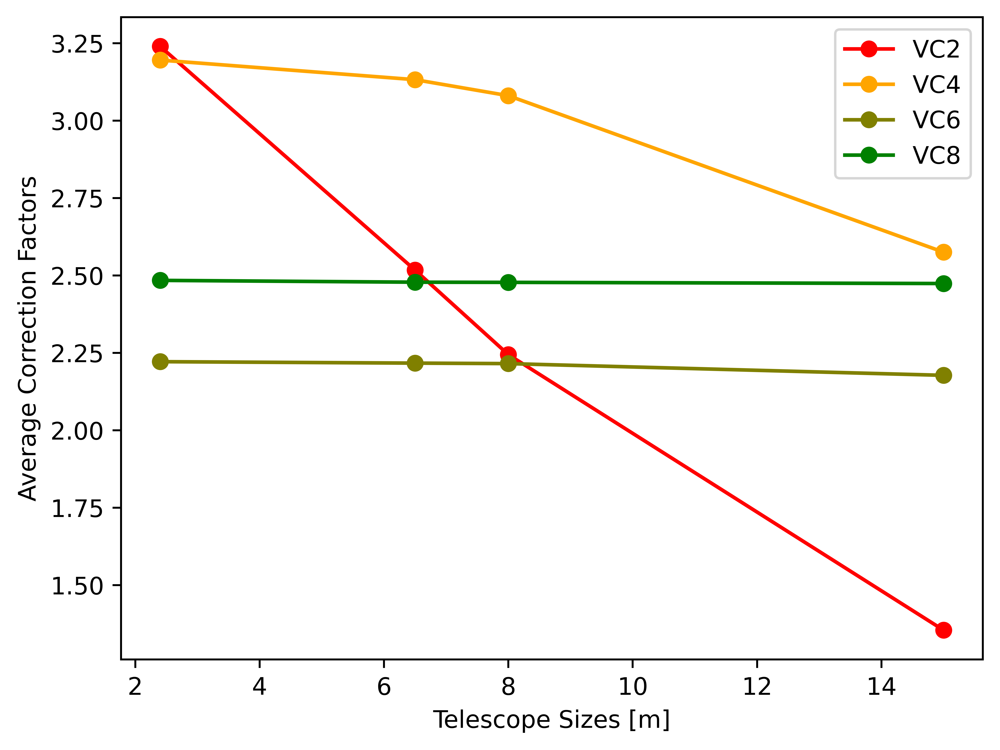

In [ ]:
# plot the correction factors vs telescope sizes
fig = plt.figure(dpi=900)
axs = plt.gca()
colors = ['red', 'orange', 'olive', 'green', 'blue', 'purple']
for i in range(len(charge_number_list)):
    # mark the data points with 'o'
    plt.plot(telescope_sizes, correction_factors_ap[i], label=f"VC{charge_number_list[i]}", marker='o', color=colors[i])
plt.xlabel("Telescope Sizes [m]")
plt.ylabel("Average Correction Factors")
#plt.title(f"VC Correction Factors for Dust Disk with {inc} deg Inc")
# log scale for y-axis
# plt.yscale('log')
plt.legend()
fig.savefig("figures/correction_factors_aperture.png", format='png', bbox_inches='tight')
plt.show()

https://www.newport.com/n/introduction-to-waveplates
https://www.spiedigitallibrary.org/journals/Journal-of-Astronomical-Telescopes-Instruments-and-Systems/volume-9/issue-2/025001/Laboratory-demonstration-of-the-wrapped-staircase-scalar-vortex-coronagraph/10.1117/1.JATIS.9.2.025001.pdf
https://docs.hcipy.org/0.3.1/tutorials/VortexCoronagraph/VortexCoronagraph.html
